# Interpolation and correlations in Zamuro

### Calculate buffers

In [ ]:
# Example usage
tif_files = ["AD.tif", "Brillo.tif", "CLlanosNDVI.tif"]
points_file = "Puntosgrabadoras.shp"
buffer_distances = [0.1, 0.5, 1.0]  # In kilometers
get_buffer_values(tif_files, points_file, buffer_distances)

NameError: ignored

## Read the Clusters

In [ ]:
ls /content/drive/MyDrive/Doctorado/2023/Julio/

 17_5_xcorycor1.csv         capaszamuro/
 17_5_xcorycor2.csv        'Clusteing analysis_periods.ipynb'
 17_5_xcorycor3.csv         Layersinterpolation_methods.ipynb
'Acoustic indices.gsheet'


In [ ]:
!pip install rasterio


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 65.2 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
csv_path1 = '/content/drive/MyDrive/Doctorado/2023/Julio/17_5_xcorycor1.csv'
df1 = pd.read_csv(csv_path1)
csv_path2 = '/content/drive/MyDrive/Doctorado/2023/Julio/17_5_xcorycor2.csv'
df2 = pd.read_csv(csv_path2)
df2
csv_path3 = '/content/drive/MyDrive/Doctorado/2023/Julio/17_5_xcorycor3.csv'
df3 = pd.read_csv(csv_path3)

In [ ]:
ls content/drive/MyDrive/Doctorado/2023/Junio/Resultados/

ls: cannot access 'content/drive/MyDrive/Doctorado/2023/Junio/Resultados/': No such file or directory


In [ ]:
csv_path1 = '/content/drive/MyDrive/Doctorado/2023/Junio/Resultados/17_5.csv'
df1 = pd.read_csv(csv_path1)


In [ ]:
df1

,Unnamed: 0,EPS,BGNf,Hf,NDSI,rBA,ADI,AEI,fecha,hora,YCOORD.y,XCOORD.y,SLAVI1,component1_prob,component2_prob
0,0,0.098853,-39.530013,0.683019,0.931742,28.300572,2.078148,0.027886,20220908.0,17.0,1950942.625,4954301.250,0.634330,3.972722e-57,1.000000e+00
1,1,0.062399,-41.446052,0.731532,0.903630,19.753533,2.038872,0.154892,20220911.0,17.5,1950142.624,4954301.247,0.370052,9.137809e-152,1.000000e+00
2,2,0.035896,-45.849585,0.713269,0.052656,1.111604,1.912820,0.319556,20220908.0,18.0,1949742.624,4954301.246,0.179750,0.000000e+00,1.000000e+00
3,3,0.069485,-32.449641,0.678060,0.941700,33.305042,2.061745,0.096217,20220909.0,17.0,1949342.624,4954301.244,0.604962,1.497396e-38,1.000000e+00
4,4,0.057404,-43.075361,0.694896,0.916140,22.849343,2.076733,0.041249,20220909.0,17.0,1948942.624,4954301.243,0.580258,1.181935e-101,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,87,0.057458,-33.573067,0.701057,0.981128,104.975421,2.062984,0.095516,20220908.0,17.0,1947742.623,4957101.251,0.636108,1.000000e+00,9.673252e-20
88,88,0.071542,-42.790586,0.677247,0.913125,22.021616,1.990855,0.226898,20220908.0,17.0,1947342.623,4957101.251,0.134615,2.077857e-105,1.000000e+00
89,89,0.115931,-39.901530,0.635327,0.943381,34.323928,2.041161,0.153127,20220908.0,4.0,1946942.623,4957101.251,0.247195,3.142167e-15,1.000000e+00
90,90,0.072926,-34.720463,0.552442,0.903791,19.788099,1.899737,0.304799,20220909.0,4.0,1946542.623,4957101.251,0.262742,1.346064e-268,1.000000e+00


## interpolate between clusters

### scale of the layers given

In [ ]:
import pandas as pd
combined_df=pd.read_csv("/content/drive/MyDrive/Doctorado/2023/Agosto/Resultados_clusteringMembership/combineedallthe_MD_coorde.csv")
combined_df

,Unnamed: 0,site,20_5_component1_prob,20_5_component2_prob,20_5_component3_prob,20_5_component4_prob,20_5_component5_prob,17_20_component1_prob,17_20_component2_prob,17_20_component3_prob,17_20_component4_prob,8_17_component1_prob,8_17_component2_prob,8_17_component3_prob,5_8_component1_prob,5_8_component2_prob,5_8_component3_prob,XCOORD.y_x,YCOORD.y_x
0,0,RZUA01,5.480498e-146,1.000000,0.0,0.0,0.0,7.465868e-11,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.250,1950942.625
1,1,RZUA03b,3.658164e-228,1.000000,0.0,0.0,0.0,6.495266e-181,1.000000e+00,0.000000e+00,2.053149e-136,1.000000e+00,0.0,9.668182e-18,1.0,0.0,0.000000e+00,4954301.247,1950142.624
2,2,RZUA04,0.000000e+00,1.000000,0.0,0.0,0.0,0.000000e+00,3.442954e-28,0.000000e+00,1.000000e+00,6.678233e-09,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.246,1949742.624
3,3,RZUA05,2.853957e-53,1.000000,0.0,0.0,0.0,2.116084e-27,1.000000e+00,0.000000e+00,0.000000e+00,1.611224e-73,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.244,1949342.624
4,4,RZUA06,2.047282e-237,1.000000,0.0,0.0,0.0,6.971128e-52,1.000000e+00,0.000000e+00,3.378401e-297,7.284527e-133,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.243,1948942.624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,83,RZUH09,3.579619e-48,0.000000,1.0,0.0,0.0,1.000000e+00,2.303501e-34,9.098747e-65,0.000000e+00,2.687258e-11,0.0,1.000000e+00,0.0,1.0,1.878216e-300,4957101.251,1947742.623
82,84,RZUH10,1.098712e-181,1.000000,0.0,0.0,0.0,0.000000e+00,1.000000e+00,0.000000e+00,3.785237e-45,1.156382e-05,0.0,9.999884e-01,1.0,0.0,0.000000e+00,4957101.251,1947342.623
83,85,RZUH11,2.239278e-03,0.997761,0.0,0.0,0.0,0.000000e+00,9.999990e-01,0.000000e+00,9.849230e-07,1.000000e+00,0.0,2.075249e-42,0.0,0.0,1.000000e+00,4957101.251,1946942.623
84,86,RZUH12,0.000000e+00,1.000000,0.0,0.0,0.0,0.000000e+00,8.730109e-61,0.000000e+00,1.000000e+00,9.999062e-01,0.0,9.378859e-05,1.0,0.0,0.000000e+00,4957101.251,1946542.623


In [ ]:
df = combined_df.dropna(subset=['XCOORD.y_x', 'YCOORD.y_x'])
df

,Unnamed: 0,site,20_5_component1_prob,20_5_component2_prob,20_5_component3_prob,20_5_component4_prob,20_5_component5_prob,17_20_component1_prob,17_20_component2_prob,17_20_component3_prob,17_20_component4_prob,8_17_component1_prob,8_17_component2_prob,8_17_component3_prob,5_8_component1_prob,5_8_component2_prob,5_8_component3_prob,XCOORD.y_x,YCOORD.y_x
0,0,RZUA01,5.480498e-146,1.000000,0.0,0.0,0.0,7.465868e-11,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.250,1950942.625
1,1,RZUA03b,3.658164e-228,1.000000,0.0,0.0,0.0,6.495266e-181,1.000000e+00,0.000000e+00,2.053149e-136,1.000000e+00,0.0,9.668182e-18,1.0,0.0,0.000000e+00,4954301.247,1950142.624
2,2,RZUA04,0.000000e+00,1.000000,0.0,0.0,0.0,0.000000e+00,3.442954e-28,0.000000e+00,1.000000e+00,6.678233e-09,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.246,1949742.624
3,3,RZUA05,2.853957e-53,1.000000,0.0,0.0,0.0,2.116084e-27,1.000000e+00,0.000000e+00,0.000000e+00,1.611224e-73,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.244,1949342.624
4,4,RZUA06,2.047282e-237,1.000000,0.0,0.0,0.0,6.971128e-52,1.000000e+00,0.000000e+00,3.378401e-297,7.284527e-133,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.243,1948942.624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,83,RZUH09,3.579619e-48,0.000000,1.0,0.0,0.0,1.000000e+00,2.303501e-34,9.098747e-65,0.000000e+00,2.687258e-11,0.0,1.000000e+00,0.0,1.0,1.878216e-300,4957101.251,1947742.623
82,84,RZUH10,1.098712e-181,1.000000,0.0,0.0,0.0,0.000000e+00,1.000000e+00,0.000000e+00,3.785237e-45,1.156382e-05,0.0,9.999884e-01,1.0,0.0,0.000000e+00,4957101.251,1947342.623
83,85,RZUH11,2.239278e-03,0.997761,0.0,0.0,0.0,0.000000e+00,9.999990e-01,0.000000e+00,9.849230e-07,1.000000e+00,0.0,2.075249e-42,0.0,0.0,1.000000e+00,4957101.251,1946942.623
84,86,RZUH12,0.000000e+00,1.000000,0.0,0.0,0.0,0.000000e+00,8.730109e-61,0.000000e+00,1.000000e+00,9.999062e-01,0.0,9.378859e-05,1.0,0.0,0.000000e+00,4957101.251,1946542.623


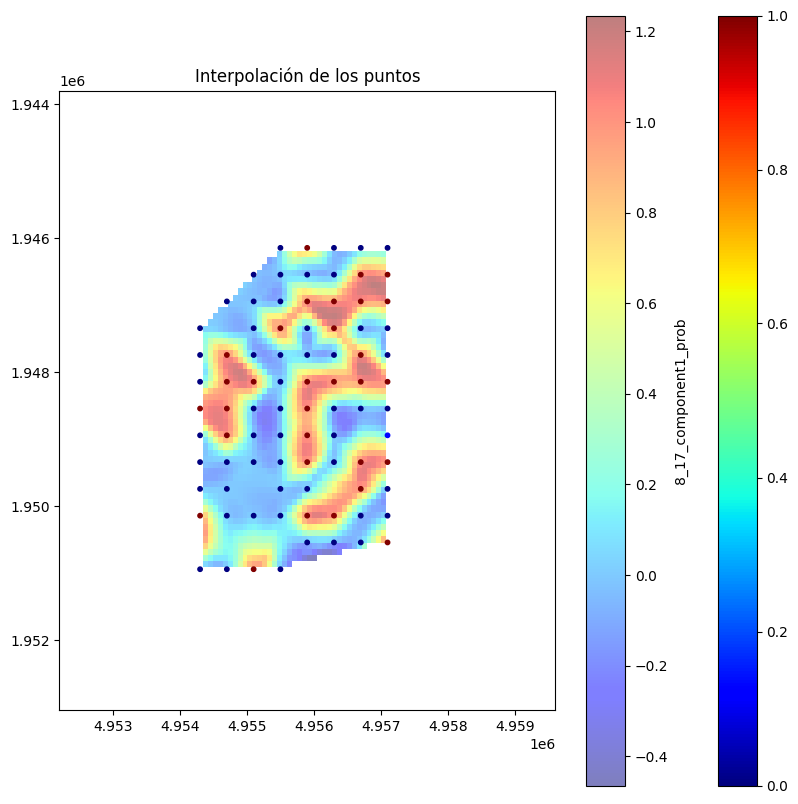

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import rasterio
from scipy.interpolate import griddata
import numpy as np

# Crear un GeoDataFrame a partir del DataFrame, utilizando XCOORD.y e YCOORD.y como coordenadas de geometría
geometry = [Point(xy) for xy in zip(df['XCOORD.y_x'], df['YCOORD.y_x'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

# Cargar el archivo TIF para obtener los límites del mapa
tif_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif'

with rasterio.open(tif_path) as tif:
    bounds = tif.bounds

# Realizar la interpolación utilizando griddata
resolution = 100
x_grid = np.linspace(bounds.left, bounds.right, resolution)
y_grid = np.linspace(bounds.top, bounds.bottom, resolution)
X, Y = np.meshgrid(x_grid, y_grid)

Z1 = griddata((df['XCOORD.y_x'], df['YCOORD.y_x']), df['8_17_component1_prob'], (X, Y), method='cubic')

# Visualizar los resultados en un mapa
fig, ax = plt.subplots(figsize=(10, 10))

# Visualizar los puntos originales
gdf.plot(ax=ax, column='8_17_component1_prob', cmap='jet', markersize=10, legend=True)

# Visualizar la interpolación como un mapa de calor
im = ax.imshow(Z1, origin='lower', extent=[bounds.left, bounds.right, bounds.top, bounds.bottom], cmap='jet', alpha=0.5)
plt.colorbar(im, ax=ax, label='8_17_component1_prob')

ax.set_title('Interpolación de los puntos')
plt.show()

In [ ]:
df

,Unnamed: 0,EPS,BGNf,Hf,NDSI,rBA,ADI,AEI,component1_prob,component2_prob,YCOORD.y,XCOORD.y
0,0,0.098853,-39.530013,0.683019,0.931742,28.300572,2.078148,0.027886,1.000000e+00,5.951963e-57,1949742.623,4957101.251
1,1,0.062399,-41.446052,0.731532,0.903630,19.753533,2.038872,0.154892,1.000000e+00,1.013919e-151,1949742.623,4957101.251
2,2,0.035896,-45.849585,0.713269,0.052656,1.111604,1.912820,0.319556,1.000000e+00,0.000000e+00,1949742.623,4957101.251
3,3,0.069485,-32.449641,0.678060,0.941700,33.305042,2.061745,0.096217,1.000000e+00,1.192217e-38,1949742.623,4957101.251
4,4,0.057404,-43.075361,0.694896,0.916140,22.849343,2.076733,0.041249,1.000000e+00,9.358877e-102,1949742.623,4957101.251
...,...,...,...,...,...,...,...,...,...,...,...,...
86,87,0.057458,-33.573067,0.701057,0.981128,104.975421,2.062984,0.095516,1.221595e-19,1.000000e+00,1949742.623,4957101.251
87,88,0.071542,-42.790586,0.677247,0.913125,22.021616,1.990855,0.226898,1.000000e+00,1.791406e-105,1949742.623,4957101.251
88,89,0.115931,-39.901530,0.635327,0.943381,34.323928,2.041161,0.153127,1.000000e+00,4.114802e-15,1949742.623,4957101.251
89,90,0.072926,-34.720463,0.552442,0.903791,19.788099,1.899737,0.304799,1.000000e+00,1.019342e-268,1949742.623,4957101.251


### IDW interpolation

### Scale of the clusters like themselves

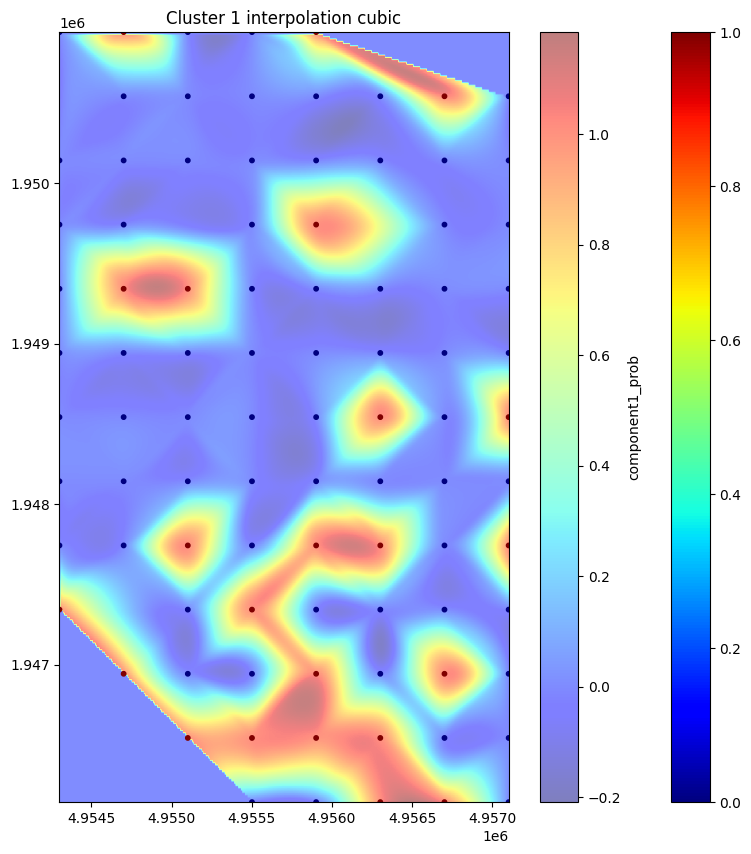

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
from scipy.interpolate import griddata



csv_path1 = '/content/drive/MyDrive/Doctorado/2023/Junio/Resultados/17_5.csv'
df1 = pd.read_csv(csv_path1)
df = df.dropna(subset=['XCOORD.y', 'YCOORD.y'])

# Crea una columna de geometría a partir de las coordenadas XCOORD.y y YCOORD.y
geometry = [Point(xy) for xy in zip(df['XCOORD.y'], df['YCOORD.y'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

from scipy.interpolate import griddata

# Define la resolución de la cuadrícula para la interpolación
resolution = 334

# Crea una cuadrícula regular para la interpolación
x_min, x_max = df['XCOORD.y'].min(), df['XCOORD.y'].max()
y_min, y_max = df['YCOORD.y'].min(), df['YCOORD.y'].max()
x_grid = np.linspace(x_min, x_max, resolution)
y_grid = np.linspace(y_min, y_max, resolution)
X, Y = np.meshgrid(x_grid, y_grid)

# Realiza la interpolación utilizando griddata
Z1 = griddata((df['XCOORD.y'], df['YCOORD.y']), df['component1_prob'], (X, Y), method='cubic',fill_value=0)

fig, ax = plt.subplots(figsize=(10, 10))

# Visualiza los puntos originales
gdf.plot(ax=ax, column='component1_prob', cmap='jet', markersize=10, legend=True)

# Visualiza la interpolación como un mapa de calor
im = ax.imshow(Z1, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet', alpha=0.5)
plt.colorbar(im, ax=ax, label='component1_prob')
limited_dataimg = im.get_array()

ax.set_title('Cluster 1 interpolation cubic')
plt.show()


In [ ]:
X.shape

(334, 334)

In [ ]:
x_grid

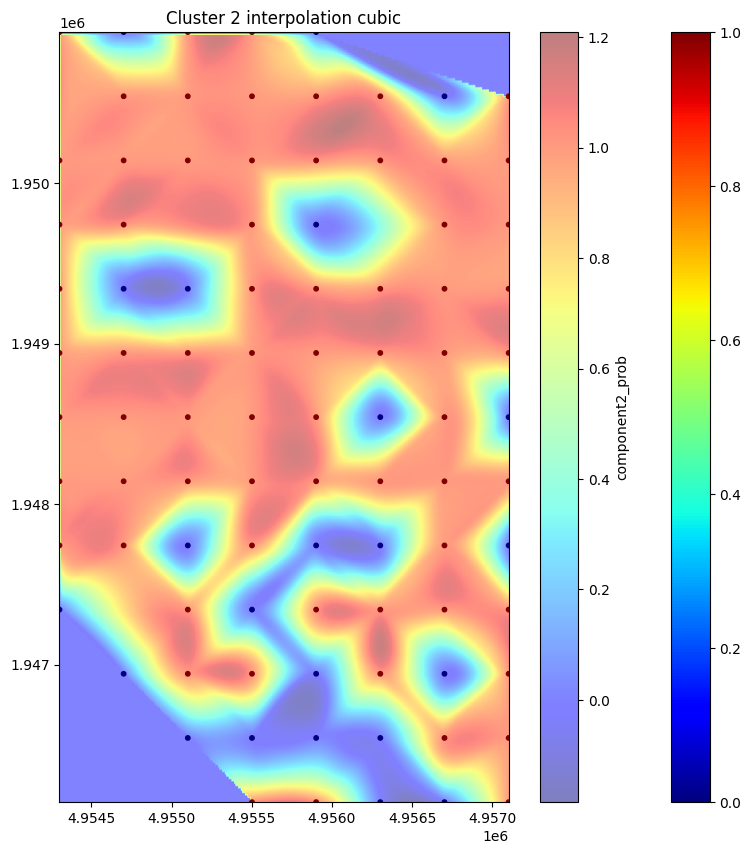

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
from scipy.interpolate import griddata



csv_path1 = '/content/drive/MyDrive/Doctorado/2023/Junio/Resultados/17_5.csv'
df1 = pd.read_csv(csv_path1)

df = df.dropna(subset=['XCOORD.y', 'YCOORD.y'])

# Crea una columna de geometría a partir de las coordenadas XCOORD.y y YCOORD.y
geometry = [Point(xy) for xy in zip(df['XCOORD.y'], df['YCOORD.y'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

from scipy.interpolate import griddata

# Define la resolución de la cuadrícula para la interpolación
resolution = 334

# Crea una cuadrícula regular para la interpolación
x_min, x_max = df['XCOORD.y'].min(), df['XCOORD.y'].max()
y_min, y_max = df['YCOORD.y'].min(), df['YCOORD.y'].max()
x_grid = np.linspace(x_min, x_max, resolution)
y_grid = np.linspace(y_min, y_max, resolution)
X, Y = np.meshgrid(x_grid, y_grid)

# Realiza la interpolación utilizando griddata
Z2 = griddata((df['XCOORD.y'], df['YCOORD.y']), df['component2_prob'], (X, Y), method='cubic',fill_value=0)

fig, ax = plt.subplots(figsize=(10, 10))

# Visualiza los puntos originales
gdf.plot(ax=ax, column='component2_prob', cmap='jet', markersize=10, legend=True)

# Visualiza la interpolación como un mapa de calor
im = ax.imshow(Z2, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet', alpha=0.5)
plt.colorbar(im, ax=ax, label='component2_prob')
limited_dataimg = im.get_array()

ax.set_title('Cluster 2 interpolation cubic')
plt.show()


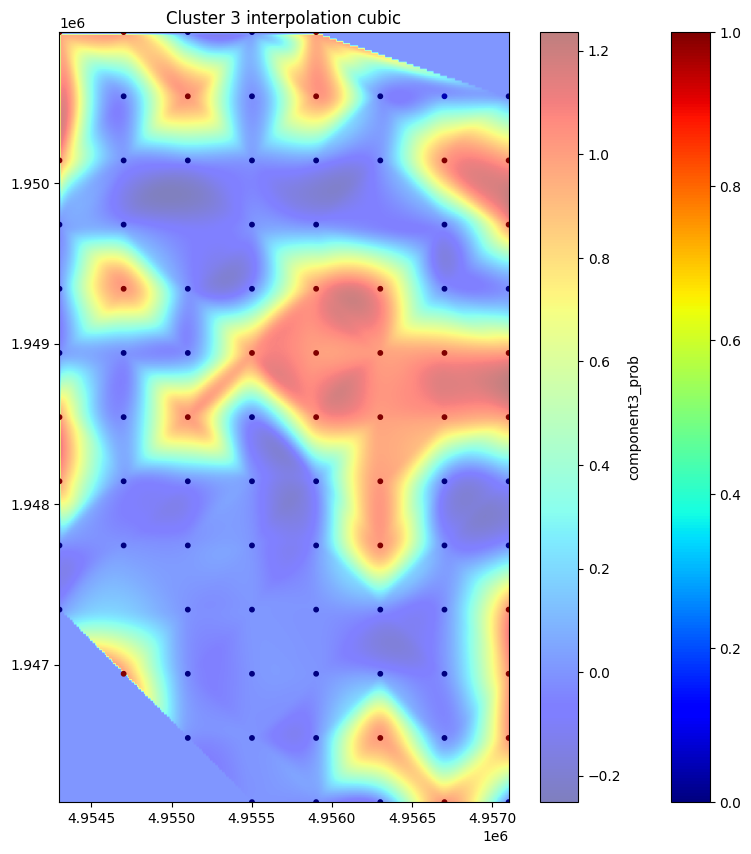

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
from scipy.interpolate import griddata



csv_path = '/content/drive/MyDrive/Doctorado/2023/Julio/17_5_xcorycor3.csv'
df = pd.read_csv(csv_path)
df = df.dropna(subset=['XCOORD.y', 'YCOORD.y'])

# Crea una columna de geometría a partir de las coordenadas XCOORD.y y YCOORD.y
geometry = [Point(xy) for xy in zip(df['XCOORD.y'], df['YCOORD.y'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

from scipy.interpolate import griddata

# Define la resolución de la cuadrícula para la interpolación
resolution = 334

# Crea una cuadrícula regular para la interpolación
x_min, x_max = df['XCOORD.y'].min(), df['XCOORD.y'].max()
y_min, y_max = df['YCOORD.y'].min(), df['YCOORD.y'].max()
x_grid = np.linspace(x_min, x_max, resolution)
y_grid = np.linspace(y_min, y_max, resolution)
X, Y = np.meshgrid(x_grid, y_grid)

# Realiza la interpolación utilizando griddata
Z3 = griddata((df['XCOORD.y'], df['YCOORD.y']), df['component3_prob'], (X, Y), method='cubic',fill_value=0)

fig, ax = plt.subplots(figsize=(10, 10))

# Visualiza los puntos originales
gdf.plot(ax=ax, column='component3_prob', cmap='jet', markersize=10, legend=True)

# Visualiza la interpolación como un mapa de calor
im = ax.imshow(Z3, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet', alpha=0.5)
plt.colorbar(im, ax=ax, label='component3_prob')
limited_dataimg = im.get_array()

ax.set_title('Cluster 3 interpolation cubic')
plt.show()


In [ ]:
ls  /content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/points

Puntosgrabadoras.dbf  Puntosgrabadoras.qmd  Puntosgrabadoras.shx
Puntosgrabadoras.prj  Puntosgrabadoras.shp


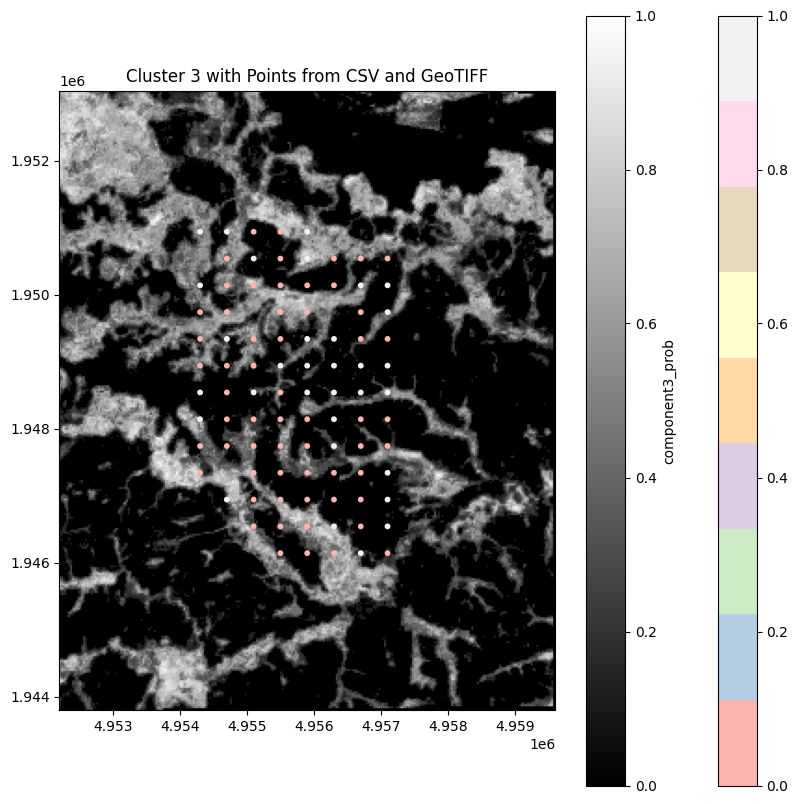

In [ ]:
import matplotlib.pyplot as plt
import rasterio
import geopandas as gpd
from shapely.geometry import Point

# Define the path to your CSV file and GeoTIFF file
csv_path = '/content/drive/MyDrive/Doctorado/2023/Julio/17_5_xcorycor3.csv'
tiff_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif'
 # Replace with your GeoTIFF file path

# Read the CSV data
df = pd.read_csv(csv_path)
df = df.dropna(subset=['XCOORD.y', 'YCOORD.y'])

# Create a GeoDataFrame from the CSV data
geometry = [Point(xy) for xy in zip(df['XCOORD.y'], df['YCOORD.y'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

# Open the GeoTIFF file
with rasterio.open(tiff_path) as src:
    # Read the raster data
    tiff_data = src.read(1)  # Assuming it's a single-band GeoTIFF

    # Get the extent of the GeoTIFF
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]

    # Create a figure and axis for plotting
    fig, ax = plt.subplots(figsize=(10, 10))

    # Display the GeoTIFF data as an image
    im = ax.imshow(tiff_data, cmap='gray', extent=extent, origin='upper')

    # Plot the points from the CSV file on top of the GeoTIFF
    gdf.plot(ax=ax, column='component3_prob', cmap='Pastel1', markersize=10, legend=True)

    # Add a colorbar
    plt.colorbar(im, ax=ax, label='component3_prob')

    # Set the title
    ax.set_title('Cluster 3 with Points from CSV and GeoTIFF')

    # Show the plot
    plt.show()


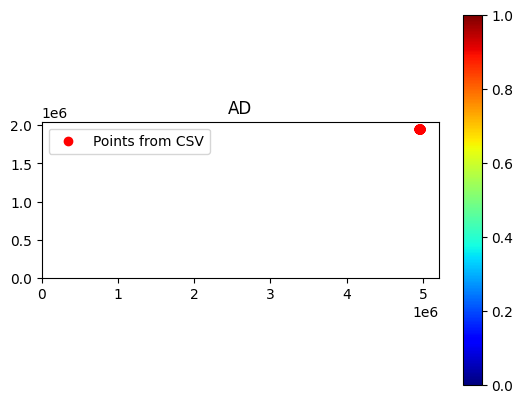

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Load the TIFF file
tif_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif'
dataset = gdal.Open(tif_path)
band = dataset.GetRasterBand(1)
dataAD = band.ReadAsArray()

# Define your extent (replace these with actual values)
x_min, x_max, y_min, y_max = 0, 100, 0, 100

# Plot the TIFF image
plt.imshow(dataAD, cmap='jet', extent=[x_min, x_max, y_min, y_max])
plt.colorbar()
plt.title("AD")

# Load the CSV file containing points
csv_path = '/content/drive/MyDrive/Doctorado/2023/Julio/17_5_xcorycor3.csv'
df = pd.read_csv(csv_path)

# Extract x and y coordinates from the CSV file
x_points = df['XCOORD.y']  # Replace 'x_column' with the actual column name in your CSV
y_points = df['YCOORD.y']  # Replace 'y_column' with the actual column name in your CSV

# Plot the points on the TIFF image
plt.scatter(x_points, y_points, color='red', marker='o', label='Points from CSV')

plt.legend()
plt.show()


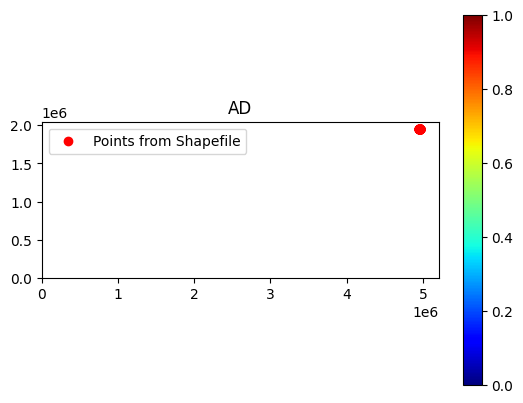

In [ ]:
from osgeo import gdal
import matplotlib.pyplot as plt
import geopandas as gpd

# Load the TIFF file
tif_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif'
dataset = gdal.Open(tif_path)
band = dataset.GetRasterBand(1)
dataAD = band.ReadAsArray()

# Define your extent (replace these with actual values)
x_min, x_max, y_min, y_max = 0, 100, 0, 100

# Plot the TIFF image
plt.imshow(dataAD, cmap='jet', extent=[x_min, x_max, y_min, y_max])
plt.colorbar()
plt.title("AD")

# Load the shapefile
shp_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/points/Puntosgrabadoras.shp'
gdf = gpd.read_file(shp_path)

# Plot the points from the shapefile
plt.scatter(gdf['XCOORD.y'], gdf['YCOORD.y'], color='red', marker='o', label='Points from Shapefile')

plt.legend()
plt.show()


In [ ]:
gdf

,field_numb,XCOORD.y,YCOORD.y,geometry
0,RZUH04,4957101.251,1949742.623,POINT (4957101.251 1949742.623)
1,RZUH13,4957101.251,1946142.623,POINT (4957101.251 1946142.623)
2,RZUH07,4957101.251,1948542.623,POINT (4957101.251 1948542.623)
3,RZUH03,4957101.251,1950142.623,POINT (4957101.251 1950142.623)
4,RZUH05,4957101.251,1949342.623,POINT (4957101.251 1949342.623)
...,...,...,...,...
89,RZUG11,4956701.251,1946942.623,POINT (4956701.251 1946942.623)
90,RZUG06,4956701.251,1948942.623,POINT (4956701.251 1948942.623)
91,RZUG04,4956701.251,1949742.623,POINT (4956701.251 1949742.623)
92,RZUG02,4956701.251,1950542.623,POINT (4956701.251 1950542.623)


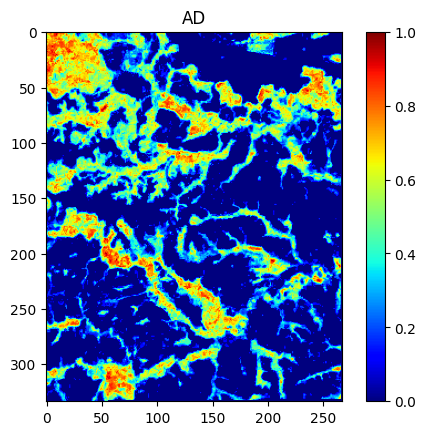

In [ ]:
import matplotlib.pyplot as plt
from osgeo import gdal

tif_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif'
dataset = gdal.Open(tif_path)
band = dataset.GetRasterBand(1)
dataAD = band.ReadAsArray()
plt.imshow(dataAD, cmap='jet')  # cmap='jet' es un ejemplo de mapa de colores, puedes ajustarlo según tus preferencias
plt.colorbar()
plt.title("AD")
plt.show()
AD = ax.imshow(dataAD, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet', alpha=0.5)


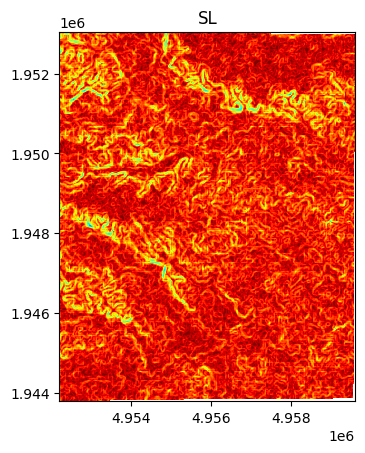

In [ ]:
import rasterio
from rasterio.plot import show
fp = r'/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/SL.tif'
img = rasterio.open(fp)
plt.title("SL")
show(img,cmap='jet')
SL = img.read(1)
#SL = ax.imshow(data, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet', alpha=0.5)


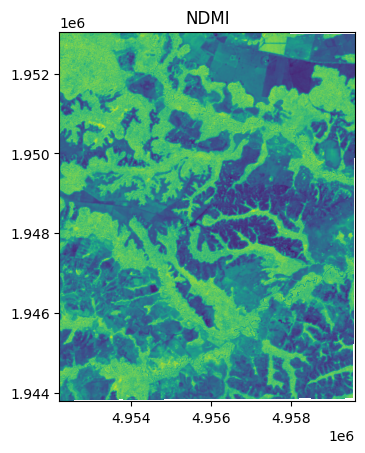

In [ ]:
import rasterio
from rasterio.plot import show
fp = r'/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/NDMI.tif'
img = rasterio.open(fp)
plt.title("NDMI")
show(img)
#data = img.read(1)
NDMI = img.read(1)

#NDMI = ax.imshow(data, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet', alpha=0.5)


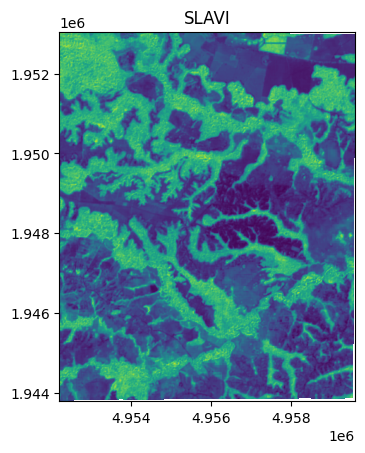

In [ ]:
import rasterio
from rasterio.plot import show
fp = r'/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/SLAVI.tif'
img = rasterio.open(fp)

plt.title("SLAVI")
show(img)
SLAVI = img.read(1)

#SLAVI = ax.imshow(data, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet', alpha=0.5)


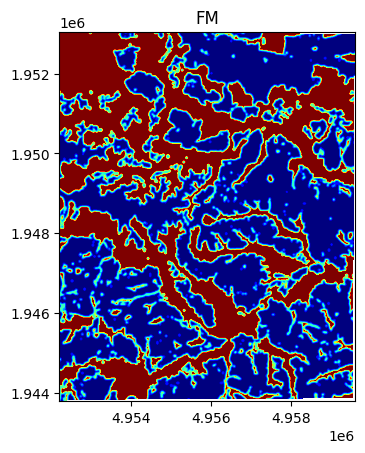

In [ ]:
import rasterio
from rasterio.plot import show
fp = r'/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/FM.tif'
img = rasterio.open(fp )
plt.title("FM")
show(img, cmap='jet')
FM = img.read(1)
#FM = ax.imshow(data, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet', alpha=0.5)


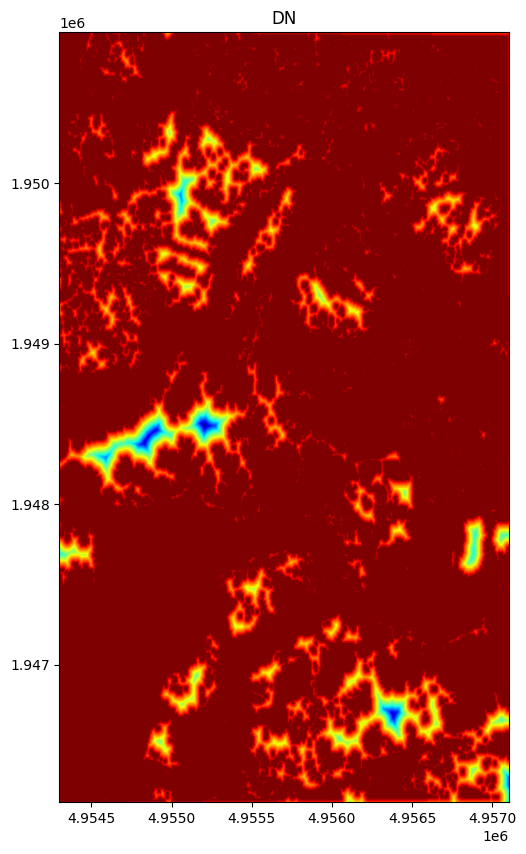

In [ ]:
import matplotlib.pyplot as plt

from osgeo import gdal, osr

tif_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/DN.tif'
dataset = gdal.Open(tif_path)
band = dataset.GetRasterBand(1)
data = band.ReadAsArray()
fig, ax = plt.subplots(figsize=(10, 10))

# Visualiza los puntos originales
DN = ax.imshow(data, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet')
plt.title("DN")
DN = DN.get_array()
plt.show()

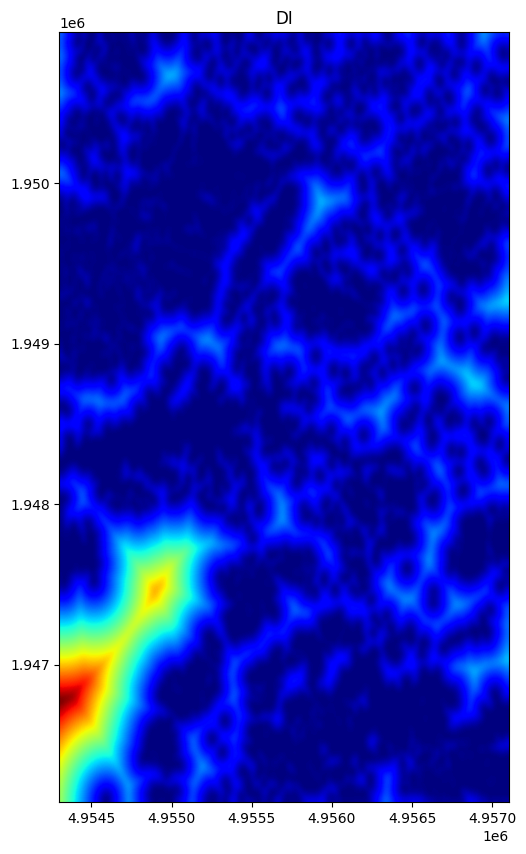

In [ ]:
import matplotlib.pyplot as plt

from osgeo import gdal, osr

tif_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/DI.tif'
dataset = gdal.Open(tif_path)
band = dataset.GetRasterBand(1)
data = band.ReadAsArray()
fig, ax = plt.subplots(figsize=(10, 10))

# Visualiza los puntos originales
im2 = ax.imshow(data, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet')
plt.title("DI")
DI = im2.get_array()
plt.show()

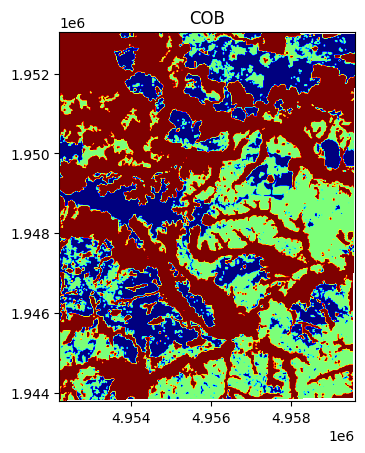

In [ ]:
import rasterio
from rasterio.plot import show
fp = r'/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/COB.tif'
img = rasterio.open(fp)

plt.title("COB")
show(img, cmap='jet')
COB = img.read(1)
#COB = ax.imshow(data, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet')


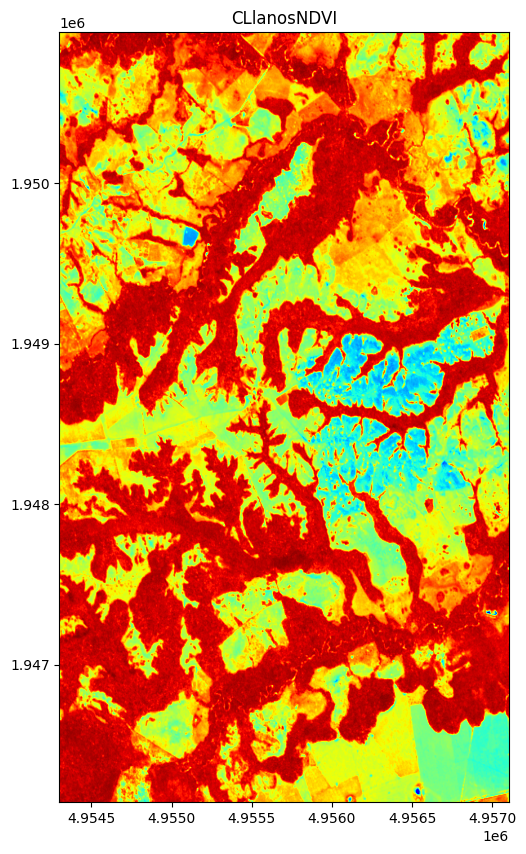

In [ ]:
import matplotlib.pyplot as plt

from osgeo import gdal, osr

tif_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/CLlanosNDVI.tif'
dataset = gdal.Open(tif_path)
band = dataset.GetRasterBand(1)
data = band.ReadAsArray()
fig, ax = plt.subplots(figsize=(10, 10))
plt.title("CLlanosNDVI")
# Visualiza los puntos originales
im2 = ax.imshow(data, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet')

CLlanosNDVI = im2.get_array()
plt.show()

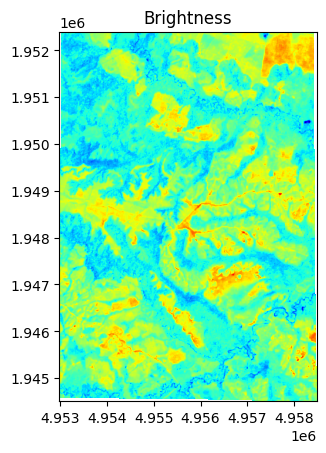

In [ ]:
import rasterio
from rasterio.plot import show
fp = r'/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/Brillo.tif'
img = rasterio.open(fp)
plt.title("Brightness")

show(img, cmap='jet')
Brillo = img.read(1)
#Brillo = ax.imshow(data, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet', alpha=0.5)


## Calculating the correlation between each cluster and each ecological layer

In [ ]:
DN= DN.data
DN

AttributeError: ignored

In [ ]:
AD= AD.get_array().data


AttributeError: ignored

In [ ]:
DN= DN.data
DI= DI.data
CLlanosNDVI=CLlanosNDVI.data

In [ ]:
import numpy as np
from scipy.signal import correlate2d

# Assuming you have the following image arrays: AD, SL, NDMI, SLAVI, FM, DN, DI, COB, CLlanosNDVI, Brillo
images = [AD, SL, NDMI, SLAVI, FM, DN, DI, COB, CLlanosNDVI, Brillo]
images2 = [Z1, Z2, Z3]

# Initialize an empty correlation matrix
correlation_matrix = np.zeros((len(images), len(images2)))

# Iterate over pairs of images to calculate the correlation coefficient
for i in range(len(images)):
    for j in range(len(images2)):
      print(i)
      image1=images[i]
      image2=images2[j]

      correlation = correlate2d(image1, image2, mode='valid')/ (np.std(image1) * np.std(image2))
      correlation
      scalar_correlation = correlation.max()
      correlation_matrix[i, j] = scalar_correlation

print("Correlation Matrix:")
print(correlation_matrix)

0
0
0
1
1
1
2
2
2
3
3
3
4
4
4
5
5
5
6
6
6
7
7
7
8
8
8
9
9
9
Correlation Matrix:
[[5.10312773e+04 1.17070454e+05 4.02863853e+04]
 [1.50601258e+02 2.05238382e+02 8.82046179e+01]
 [1.21003042e+02 1.36035031e+02 7.72604498e+01]
 [1.10463485e+02 1.09673312e+02 6.13000127e+01]
 [8.56689092e+01 1.47149719e+02 6.41696386e+01]
 [8.04274252e+05 2.15208273e+06 9.28536435e+05]
 [1.18405401e+05 4.02703632e+05 1.36896679e+05]
 [1.23826718e+02 1.79361588e+02 7.72314894e+01]
 [3.08194954e+05 8.28025353e+05 3.52421754e+05]
 [8.13516019e+01 8.82467709e+01 9.78075202e+01]]


In [ ]:
correlation_matrix

array([[5.10312773e+04, 1.17070454e+05, 4.02863853e+04],
       [1.50601258e+02, 2.05238382e+02, 8.82046179e+01],
       [1.21003042e+02, 1.36035031e+02, 7.72604498e+01],
       [1.10463485e+02, 1.09673312e+02, 6.13000127e+01],
       [8.56689092e+01, 1.47149719e+02, 6.41696386e+01],
       [8.04274252e+05, 2.15208273e+06, 9.28536435e+05],
       [1.18405401e+05, 4.02703632e+05, 1.36896679e+05],
       [1.23826718e+02, 1.79361588e+02, 7.72314894e+01],
       [3.08194954e+05, 8.28025353e+05, 3.52421754e+05],
       [8.13516019e+01, 8.82467709e+01, 9.78075202e+01]])

In [ ]:
titles = ['AD', 'SL', 'NDMI', 'SLAVI', 'FM', 'DN', 'DI', 'COB', 'CLlanosNDVI', 'Brillo']

titles2 = ['Z1','Z2','Z3']


In [ ]:
correlation_matrix.argmax()

16

In [ ]:
df=pd.DataFrame(data=correlation_matrix,    # values
           index=titles,    # 1st column as index
           columns=titles2)

In [ ]:
df

,Z1,Z2,Z3
AD,51031.277275,1.170705e+05,40286.385302
SL,150.601258,2.052384e+02,88.204618
NDMI,121.003042,1.360350e+02,77.260450
SLAVI,110.463485,1.096733e+02,61.300013
FM,85.668909,1.471497e+02,64.169639
DN,804274.252484,2.152083e+06,928536.435324
DI,118405.400562,4.027036e+05,136896.678887
COB,123.826718,1.793616e+02,77.231489
CLlanosNDVI,308194.954112,8.280254e+05,352421.753883
Brillo,81.351602,8.824677e+01,97.807520


In [ ]:
max_value_pos = df.values.argmax()

# Convert the position to row and column indices
row_index, col_index = divmod(max_value_pos, len(df.columns))

# Retrieve the column and index labels
max_column = df.columns[col_index]
max_index = df.index[row_index]

print("Maximum Value Position:")
print("Column:", max_column)
print("Index:", max_index)

Maximum Value Position:
Column: Z2
Index: DN


In [ ]:
max_value_positions = df.idxmax(axis=0)

# Retrieve the column and index labels for each maximum value
for col_label, row_index in max_value_positions.iteritems():
    max_column = col_label
    max_index = df.index[row_index]
    print("Maximum Value Position:")
    print("Column:", max_column)
    print("Index:", max_index)
    print()

<ipython-input-64-d01db7faba22>:4: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_label, row_index in max_value_positions.iteritems():


IndexError: ignored

In [ ]:
import os
import pandas as pd
import numpy as np
from scipy.spatial import distance

import math
def mean2(x):
    y = np.sum(x) / np.size(x);
    return y

def corr2(a,b):
    a = a - mean2(a)
    b = b - mean2(b)

    r = (a*b).sum() / math.sqrt((a*a).sum() * (b*b).sum());
    return r

In [ ]:
image1=Z1
image2=AD.get_array().data

AttributeError: ignored

In [ ]:

from scipy.signal import correlate2d
correlation = correlate2d(image1, image2, mode='valid')/ (np.std(image1) * np.std(image2))
correlation
scalar_correlation = correlation.max()
scalar_correlation

56353.66695528908

In [ ]:
from scipy.signal import correlate2d
correlation = correlate2d(Z1, SL, mode='valid')/ (np.std(Z1) * np.std(AD.get_array().data))
correlation

AttributeError: ignored

In [ ]:
from scipy.signal import correlate2d
correlation = correlate2d(Z1, AD.get_array().data, mode='valid')/ (np.std(Z1) * np.std(AD.get_array().data))
correlation
scalar_correlation = correlation.max()
scalar_correlation

In [ ]:
AD.get_array().data

In [ ]:
Z1

In [ ]:
import numpy as np
from scipy.signal import correlate2d

# Assuming you have the following image arrays: AD, SL, NDMI, SLAVI, FM, DN, DI, COB, CLlanosNDVI, Brillo
images = [AD, SL, NDMI, SLAVI, FM, DN, DI, COB, CLlanosNDVI, Brillo]
images2 = [Z1, Z2, Z3]

# Initialize an empty correlation matrix
correlation_matrix = np.zeros((len(images), len(images2)))

# Iterate over pairs of images to calculate the correlation coefficient
for i in range(len(images)):
    for j in range(len(images2)):
      print(i)
      image1=images[i]
      image2=images2[j]

      correlation = corr2(image1, image2)
      correlation
      scalar_correlation = correlation.max()
      correlation_matrix[i, j] = scalar_correlation

print("Correlation Matrix:")
print(correlation_matrix)

# INTERPOLATE Taking in account the buffers


In [ ]:
!pip install rasterio


In [ ]:
buffer=pd.read_csv("/content/drive/MyDrive/Doctorado/2023/Agosto/buffer.csv")

In [ ]:
buffer=buffer.rename(columns={'field_numb': 'site'})

In [ ]:
buffer

,Unnamed: 0,site,XCOORD.y_x,YCOORD.y_x,FM100_b100mean_100,FM100_b100median_100,DN100_b100mean_100,DN100_b100median_100,DI300_b300mean_300,DI300_b300median_300,...,llanos200_b200mean_200,llanos200_b200median_200,ICHN250_b250mean_250,ICHN250_b250median_250,FM200_b200mean_200,FM200_b200median_200,ICHN200_b200mean_200,ICHN200_b200median_200,ICHN100_b100mean_100,ICHN100_b100median_100
0,0,RZUH04,4957101.251,1949742.623,0.566359,0.428571,0.994023,1.000000,0.021562,0.017169,...,0.633902,0.674904,3.695705,2.964900,0.406593,0.285714,3.897863,3.826510,4.403582,4.860768
1,1,RZUH13,4957101.251,1946142.623,0.374368,0.285714,0.989796,1.000000,0.048132,0.038085,...,0.708133,0.677419,4.064086,3.610703,0.351490,0.142857,3.963771,3.458915,3.844683,3.446898
2,2,RZUH07,4957101.251,1948542.623,0.860328,1.000000,1.000000,1.000000,0.122280,0.117288,...,0.634595,0.804584,4.178706,4.112499,0.537534,0.428571,4.528694,4.717087,5.599637,5.892776
3,3,RZUH03,4957101.251,1950142.623,0.000000,0.000000,0.962053,0.966667,0.025790,0.021935,...,0.539273,0.524573,3.133335,2.844066,0.074912,0.000000,2.915847,2.820796,2.655582,2.643383
4,4,RZUH05,4957101.251,1949342.623,0.000000,0.000000,0.904278,0.905719,0.016334,0.011035,...,0.473106,0.470548,2.665966,2.546518,0.006852,0.000000,2.420657,2.278752,2.283471,2.179857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,89,RZUG11,4956701.251,1946942.623,0.000000,0.000000,0.923325,0.952860,0.017890,0.004604,...,0.593373,0.594655,2.725623,2.543377,0.004568,0.000000,2.697263,2.518030,2.663043,2.499282
90,90,RZUG06,4956701.251,1948942.623,0.041330,0.000000,0.996210,1.000000,0.048203,0.045054,...,0.368798,0.331849,2.741621,2.661483,0.050955,0.000000,2.711688,2.647368,2.722365,2.651659
91,91,RZUG04,4956701.251,1949742.623,0.006452,0.000000,0.994832,1.000000,0.051862,0.036262,...,0.503615,0.440694,3.401347,2.831349,0.127796,0.000000,3.172447,2.791546,2.732733,2.771929
92,92,RZUG02,4956701.251,1950542.623,0.698113,1.000000,0.999567,1.000000,0.067338,0.064962,...,0.774556,0.835862,4.935268,5.585879,0.646724,1.000000,4.960324,5.657243,5.114465,5.605247


In [ ]:
import pandas as pd
combined_df=pd.read_csv("/content/drive/MyDrive/Doctorado/2023/Agosto/Resultados_clusteringMembership/combineedallthe_MD.csv")
combined_df

,site,20_5_component1_prob,20_5_component2_prob,20_5_component3_prob,20_5_component4_prob,20_5_component5_prob,17_20_component1_prob,17_20_component2_prob,17_20_component3_prob,17_20_component4_prob,8_17_component1_prob,8_17_component2_prob,8_17_component3_prob,5_8_component1_prob,5_8_component2_prob,5_8_component3_prob
0,RZUA01,5.480498e-146,1.0,0.0,0.0,0.0,7.465868e-11,1.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,1.000000e+00,1.0,0.0,0.000000e+00
1,RZUA03b,3.658164e-228,1.0,0.0,0.0,0.0,6.495266e-181,1.000000e+00,0.0,2.053149e-136,1.000000e+00,0.0,9.668182e-18,1.0,0.0,0.000000e+00
2,RZUA04,0.000000e+00,1.0,0.0,0.0,0.0,0.000000e+00,3.442954e-28,0.0,1.000000e+00,6.678233e-09,0.0,1.000000e+00,1.0,0.0,0.000000e+00
3,RZUA05,2.853957e-53,1.0,0.0,0.0,0.0,2.116084e-27,1.000000e+00,0.0,0.000000e+00,1.611224e-73,0.0,1.000000e+00,1.0,0.0,0.000000e+00
4,RZUA06,2.047282e-237,1.0,0.0,0.0,0.0,6.971128e-52,1.000000e+00,0.0,3.378401e-297,7.284527e-133,0.0,1.000000e+00,1.0,0.0,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,RZUC02,NaN,NaN,NaN,NaN,NaN,0.000000e+00,1.530445e-44,0.0,1.000000e+00,2.898981e-05,0.0,9.999710e-01,NaN,NaN,NaN
92,RZUD02,NaN,NaN,NaN,NaN,NaN,0.000000e+00,2.884759e-77,0.0,1.000000e+00,9.999179e-01,0.0,8.214720e-05,1.0,0.0,0.000000e+00
93,RZUE01,NaN,NaN,NaN,NaN,NaN,9.084967e-32,7.703041e-97,1.0,0.000000e+00,0.000000e+00,1.0,1.175775e-28,0.0,1.0,1.301129e-84
94,RZUF04,NaN,NaN,NaN,NaN,NaN,0.000000e+00,1.193582e-45,0.0,1.000000e+00,3.871807e-06,0.0,9.999961e-01,NaN,NaN,NaN


In [ ]:
cd /content/drive/MyDrive/Doctorado/2023/Agosto/

/content/drive/MyDrive/Doctorado/2023/Agosto


In [ ]:
!mkdir Interpolationlayers

mkdir: cannot create directory ‘Interpolationlayers’: File exists


In [ ]:
cd Interpolationlayers

/content/drive/MyDrive/Doctorado/2023/Agosto/Interpolationlayers


In [ ]:
combined_df = pd.merge(combined_df, buffer[['site', 'XCOORD.y_x', 'YCOORD.y_x']], on='site', how='left')


In [ ]:
combined_df=combined_df.dropna()

In [ ]:
combined_df

,site,20_5_component1_prob,20_5_component2_prob,20_5_component3_prob,20_5_component4_prob,20_5_component5_prob,17_20_component1_prob,17_20_component2_prob,17_20_component3_prob,17_20_component4_prob,8_17_component1_prob,8_17_component2_prob,8_17_component3_prob,5_8_component1_prob,5_8_component2_prob,5_8_component3_prob,XCOORD.y_x,YCOORD.y_x
0,RZUA01,5.480498e-146,1.000000,0.0,0.0,0.0,7.465868e-11,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.250,1950942.625
1,RZUA03b,3.658164e-228,1.000000,0.0,0.0,0.0,6.495266e-181,1.000000e+00,0.000000e+00,2.053149e-136,1.000000e+00,0.0,9.668182e-18,1.0,0.0,0.000000e+00,4954301.247,1950142.624
2,RZUA04,0.000000e+00,1.000000,0.0,0.0,0.0,0.000000e+00,3.442954e-28,0.000000e+00,1.000000e+00,6.678233e-09,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.246,1949742.624
3,RZUA05,2.853957e-53,1.000000,0.0,0.0,0.0,2.116084e-27,1.000000e+00,0.000000e+00,0.000000e+00,1.611224e-73,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.244,1949342.624
4,RZUA06,2.047282e-237,1.000000,0.0,0.0,0.0,6.971128e-52,1.000000e+00,0.000000e+00,3.378401e-297,7.284527e-133,0.0,1.000000e+00,1.0,0.0,0.000000e+00,4954301.243,1948942.624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,RZUH09,3.579619e-48,0.000000,1.0,0.0,0.0,1.000000e+00,2.303501e-34,9.098747e-65,0.000000e+00,2.687258e-11,0.0,1.000000e+00,0.0,1.0,1.878216e-300,4957101.251,1947742.623
84,RZUH10,1.098712e-181,1.000000,0.0,0.0,0.0,0.000000e+00,1.000000e+00,0.000000e+00,3.785237e-45,1.156382e-05,0.0,9.999884e-01,1.0,0.0,0.000000e+00,4957101.251,1947342.623
85,RZUH11,2.239278e-03,0.997761,0.0,0.0,0.0,0.000000e+00,9.999990e-01,0.000000e+00,9.849230e-07,1.000000e+00,0.0,2.075249e-42,0.0,0.0,1.000000e+00,4957101.251,1946942.623
86,RZUH12,0.000000e+00,1.000000,0.0,0.0,0.0,0.000000e+00,8.730109e-61,0.000000e+00,1.000000e+00,9.999062e-01,0.0,9.378859e-05,1.0,0.0,0.000000e+00,4957101.251,1946542.623


In [ ]:
combined_df.to_csv('/content/drive/MyDrive/Doctorado/2023/Agosto/Resultados_clusteringMembership/combineedallthe_MD_coorde.csv')

In [ ]:

# Assuming "combined_df" is your DataFrame containing all the component columns
# "coordinates_df" is the DataFrame containing ['XCOORD.y', 'YCOORD.y', 'site']
coordinates_df = buffer  # Replace with the actual path to your CSV file
for column in combined_df.columns:
    if column.startswith("component"):
        output_path = f"{column}_interpolation.tif"
        interpolate_and_save_tif(combined_df, coordinates_df, 'site', column, output_path)


In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point
from scipy.interpolate import griddata
import rasterio

# Function to interpolate and plot each component column
def interpolate_and_save_tif(df, component_column, output_path):
    # Drop rows with missing XCOORD.y and YCOORD.y values
    df = df.dropna(subset=['XCOORD.y_x', 'YCOORD.y_x'])

    # Create a GeoDataFrame with geometry column from XCOORD.y and YCOORD.y
    geometry = [Point(xy) for xy in zip(df['XCOORD.y_x'], df['YCOORD.y_x'])]
    gdf = gpd.GeoDataFrame(df, geometry=geometry)

    # Define the resolution of the grid for interpolation

    resolution = 334

    # Create a regular grid for interpolation
    x_min, x_max = df['XCOORD.y_x'].min(), df['XCOORD.y_x'].max()
    y_min, y_max = df['YCOORD.y_x'].min(), df['YCOORD.y_x'].max()
    x_grid = np.linspace(x_min, x_max, resolution)
    y_grid = np.linspace(y_min, y_max, resolution)
    X, Y = np.meshgrid(x_grid, y_grid)

    # Perform the interpolation using griddata
    Z = griddata((df['XCOORD.y_x'], df['YCOORD.y_x']), df[component_column], (X, Y), method='cubic', fill_value=0)

    # Save the interpolation result to a TIFF file
    transform = rasterio.transform.from_origin(x_min, y_max, (x_max - x_min) / resolution, (y_max - y_min) / resolution)
    with rasterio.open(output_path, 'w', driver='GTiff', height=resolution, width=resolution, count=1, dtype=Z.dtype, crs='EPSG:4326', transform=transform) as dst:
        dst.write(Z, 1)




In [ ]:
combined_df.columns

Index(['site', '20_5_component1_prob', '20_5_component2_prob',
       '20_5_component3_prob', '20_5_component4_prob', '20_5_component5_prob',
       '17_20_component1_prob', '17_20_component2_prob',
       '17_20_component3_prob', '17_20_component4_prob',
       '8_17_component1_prob', '8_17_component2_prob', '8_17_component3_prob',
       '5_8_component1_prob', '5_8_component2_prob', '5_8_component3_prob',
       'XCOORD.y_x', 'YCOORD.y_x'],
      dtype='object')

In [ ]:
# Assuming "combined_df" is your DataFrame containing all the component columns
for column in combined_df.columns:
    if column.endswith("_prob"):
        output_path = f"{column}_interpolation.tif"
        interpolate_and_save_tif(combined_df, column, output_path)

In [ ]:
ls

17_20_component1_prob_interpolation.tif  20_5_component5_prob_interpolation.tif
17_20_component2_prob_interpolation.tif  5_8_component1_prob_interpolation.tif
17_20_component3_prob_interpolation.tif  5_8_component2_prob_interpolation.tif
17_20_component4_prob_interpolation.tif  5_8_component3_prob_interpolation.tif
20_5_component1_prob_interpolation.tif   8_17_component1_prob_interpolation.tif
20_5_component2_prob_interpolation.tif   8_17_component2_prob_interpolation.tif
20_5_component3_prob_interpolation.tif   8_17_component3_prob_interpolation.tif
20_5_component4_prob_interpolation.tif


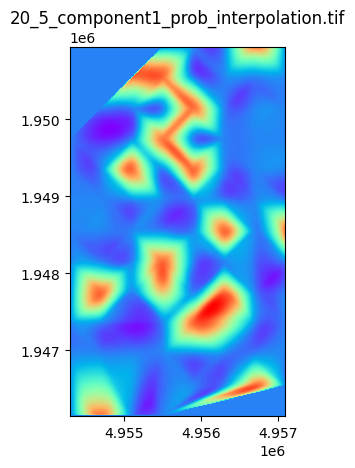

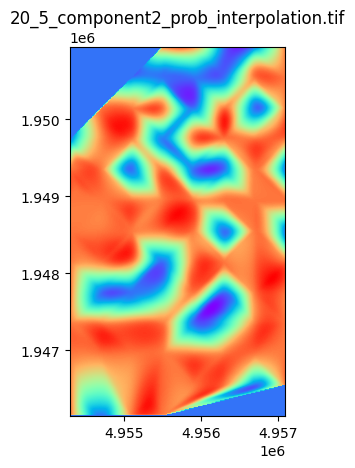

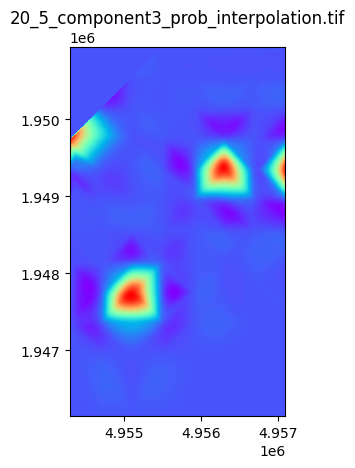

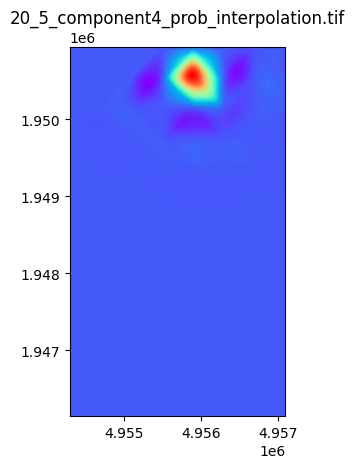

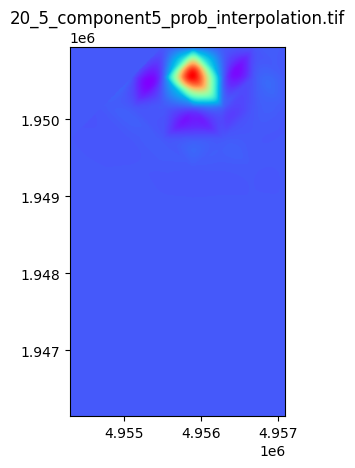

...

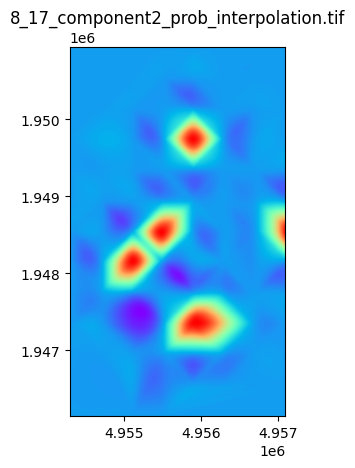

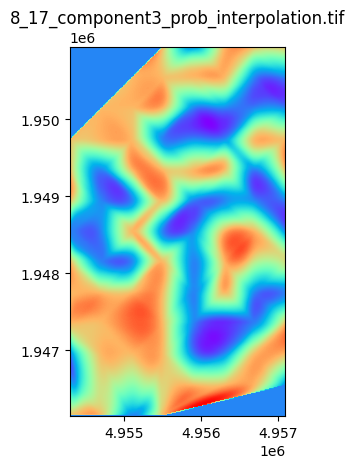

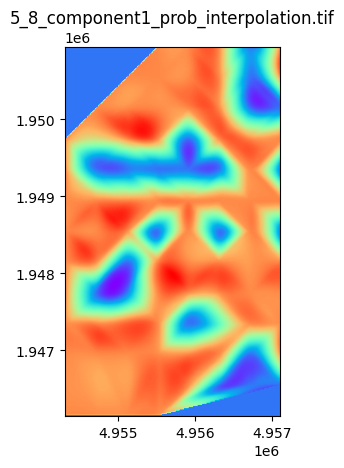

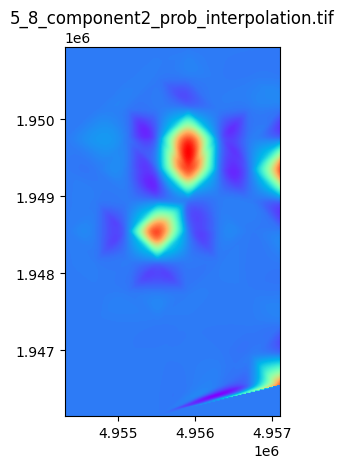

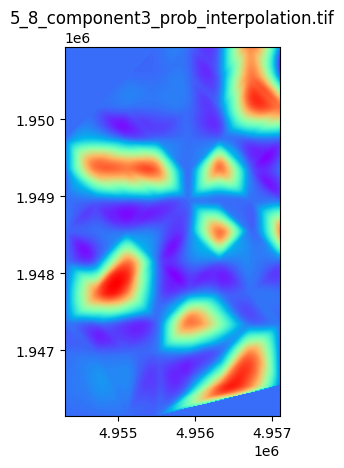

In [ ]:
import os
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show

tif_folder = '/content/drive/MyDrive/Doctorado/2023/Agosto/Interpolationlayers/'

# Get a list of all TIFF files in the folder
tif_files = [os.path.join(tif_folder, filename) for filename in os.listdir(tif_folder) if filename.endswith('.tif')]

# Loop through each TIFF file and plot it
# Loop through each TIFF file and plot it with 'jet' colormap
for tif_file in tif_files:
    with rasterio.open(tif_file) as src:
        plt.figure()
        plt.title(os.path.basename(tif_file))
        show(src, cmap='rainbow')
        plt.show()

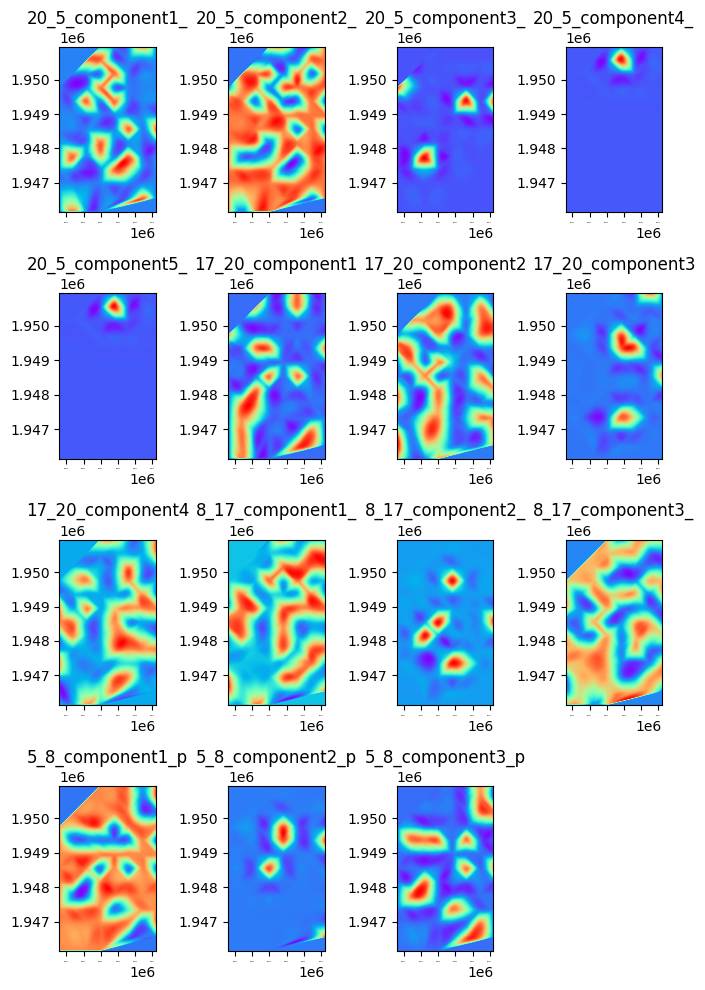

In [ ]:
import os
import math
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show

tif_folder = '/content/drive/MyDrive/Doctorado/2023/Agosto/Interpolationlayers/'

# Get a list of all TIFF files in the folder
tif_files = [os.path.join(tif_folder, filename) for filename in os.listdir(tif_folder) if filename.endswith('.tif')]

num_files = len(tif_files)
num_cols = int(math.ceil(math.sqrt(num_files)))  # Number of columns of subplots
num_rows = int(math.ceil(num_files / num_cols))  # Number of rows of subplots

# Create a figure with subplots based on the number of files
fig, axes = plt.subplots(num_rows, num_cols, figsize=(7, 10))

# Loop through each TIFF file and plot it in a subplot
for idx, tif_file in enumerate(tif_files):
    row = idx // num_cols
    col = idx % num_cols
    with rasterio.open(tif_file) as src:
        axes[row, col].set_title(os.path.basename(tif_file)[:16])
        show(src, ax=axes[row, col], cmap='rainbow')

        # Reduce x-axis tick label size
        axes[row, col].tick_params(axis='x', labelsize=1)

# Remove empty subplots if necessary
if num_files < num_rows * num_cols:
    for idx in range(num_files, num_rows * num_cols):
        row = idx // num_cols
        col = idx % num_cols
        fig.delaxes(axes[row, col])

# Adjust layout and show the figure
plt.tight_layout()
plt.show()


## Correlation between tif layers

In [ ]:
pip install gdal


In [ ]:
from osgeo import gdal, ogr
import numpy as np



def resample_array(src_array, src_geotransform, src_projection, dst_shape):
    src_ds = gdal.GetDriverByName('MEM').Create('', src_array.shape[1], src_array.shape[0], 1, gdal.GDT_Float32)
    src_ds.GetRasterBand(1).WriteArray(src_array)

    src_srs = osr.SpatialReference()
    src_srs.ImportFromWkt(src_projection)

    dst_ds = gdal.GetDriverByName('MEM').Create('', dst_shape[1], dst_shape[0], 1, gdal.GDT_Float32)
    dst_ds.SetGeoTransform(src_geotransform)
    dst_ds.SetProjection(src_srs.ExportToWkt())

    gdal.ReprojectImage(src_ds, dst_ds, src_srs.ExportToWkt(), src_srs.ExportToWkt(), gdal.GRA_Bilinear)

    return dst_ds.GetRasterBand(1).ReadAsArray()

def compare_tifs(tif_file1, tif_file2, shp_file):
    # Read the TIFF files
    tif_array1, geo_transform1 = read_tif(tif_file1)
    tif_array2, geo_transform2 = read_tif(tif_file2)

    # Read the shapefile
    points = read_shp(shp_file)

    # If geotransforms differ, reproject one of the TIFF arrays to match the other
    if geo_transform1 != geo_transform2:
        tif_array1 = reproject_tif(tif_array1, geo_transform1, gdal.Open(tif_file1).GetProjection(), geo_transform2, gdal.Open(tif_file2).GetProjection())
        geo_transform1 = geo_transform2

    # Clip both TIFF arrays to the bounding box defined by the shapefile points
    clipped_tif_array1 = clip_tif(tif_array1, points, geo_transform1)
    clipped_tif_array2 = clip_tif(tif_array2, points, geo_transform2)

    # Resample both clipped arrays to the same shape
    max_height = max(clipped_tif_array1.shape[0], clipped_tif_array2.shape[0])
    max_width = max(clipped_tif_array1.shape[1], clipped_tif_array2.shape[1])
    clipped_tif_array1 = resample_array(clipped_tif_array1, geo_transform1, gdal.Open(tif_file1).GetProjection(), (max_height, max_width))
    clipped_tif_array2 = resample_array(clipped_tif_array2, geo_transform2, gdal.Open(tif_file2).GetProjection(), (max_height, max_width))

    # Check if standard deviations are zero
    std_dev1 = np.std(clipped_tif_array1)
    std_dev2 = np.std(clipped_tif_array2)

    if std_dev1 == 0 or std_dev2 == 0:
        # Handle case where standard deviation is zero (correlation coefficient is NaN)
        correlation = np.nan  # You can set a default value or handle it according to your use case
    else:
        # Calculate the correlation coefficient
        correlation = np.corrcoef(clipped_tif_array1.flatten(), clipped_tif_array2.flatten())[0, 1]

    return correlation

def read_tif(tif_file):
    dataset = gdal.Open(tif_file)
    if dataset is None:
        raise Exception(f"Error: Could not open the TIFF file '{tif_file}'")
    band = dataset.GetRasterBand(1)
    array = band.ReadAsArray()
    return array



In [ ]:
read_tif(tif_file1)

array([[0.64, 0.72, 0.84, ..., 0.  , 0.  , 0.  ],
       [0.6 , 0.72, 0.72, ..., 0.  , 0.  , 0.  ],
       [0.52, 0.72, 0.72, ..., 0.  , 0.  , 0.  ],
       ...,
       [0.24, 0.  , 0.  , ..., 0.76, 0.68, 0.  ],
       [0.16, 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.12, 0.  , 0.  , ..., 0.  , 0.  , 0.  ]], dtype=float32)

In [ ]:

tif_file1 = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif'
tif_file2 = '/content/drive/MyDrive/Doctorado/2023/Agosto/Interpolationlayers/17_20_component1_prob_interpolation.tif'

shp_file = "/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/points/Puntosgrabadoras.shp"

result = compare_tifs(tif_file1, tif_file2, shp_file)
print(result)

ValueError: ignored

In [ ]:
# Example usage:
tif_file1 = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif'
tif_file2 = '/content/drive/MyDrive/Doctorado/2023/Agosto/Interpolationlayers/17_20_component1_prob_interpolation.tif'
correlation = correlate_tif_layers(tif_file1, tif_file2)
print(f"Correlation: {correlation}")

TypeError: ignored

# shape points

In [ ]:
import matplotlib.pyplot as plt
import rasterio
import geopandas as gpd
from shapely.geometry import Point

# Define the path to your CSV file and GeoTIFF file
csv_path = '/content/drive/MyDrive/Doctorado/2023/Julio/17_5_xcorycor3.csv'
tiff_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif'
 # Replace with your GeoTIFF file path
def plottiff(csv_path,tiff_path):
  # Read the CSV data
  df = pd.read_csv(csv_path)
  df = df.dropna(subset=['XCOORD.y_x', 'YCOORD.y_x'])

  # Create a GeoDataFrame from the CSV data
  geometry = [Point(xy) for xy in zip(df['XCOORD.y_x'], df['YCOORD.y_x'])]
  gdf = gpd.GeoDataFrame(df, geometry=geometry)

  # Open the GeoTIFF file
  with rasterio.open(tiff_path) as src:
      # Read the raster data
      tiff_data = src.read(1)  # Assuming it's a single-band GeoTIFF

      # Get the extent of the GeoTIFF
      extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]

      # Create a figure and axis for plotting
      fig, ax = plt.subplots(figsize=(10, 10))

      # Display the GeoTIFF data as an image
      im = ax.imshow(tiff_data, cmap='gray', extent=extent, origin='upper')

      # Plot the points from the CSV file on top of the GeoTIFF
      gdf.plot(ax=ax, column='component1_prob', cmap='plasma', markersize=50, legend=True)

      # Add a colorbar
      plt.colorbar(im, ax=ax, label='component3_prob')

      # Set the title
      ax.set_title('Cluster 3 with Points from CSV and GeoTIFF')

      # Show the plot
      plt.show()


In [ ]:
ls /content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/

 AD.tif               CLlanosNDVI.tif.aux.xml   NDMI.tif
 AD.tif.aux.xml       COB.tif                   NDMI.tif.aux.xml
 Brillo.tif           COB.tif.aux.xml           points/
 Brillo.tif.aux.xml   DI.tif                   'Puntos grabadoras.zip'
 buffer               DI.tif.aux.xml            SLAVI.tif
 buffer.csv           DN.tif                    SLAVI.tif.aux.xml
 buffer.gpkg          DN.tif.aux.xml            SL.tif
 buffer.gpkg-shm      FM.tif                    SL.tif.aux.xml
 buffer.gpkg-wal      FM.tif.aux.xml            zamuro.qgz
 buffer.qmd           ICHN.tif
 CLlanosNDVI.tif      ICHN.tif.aux.xml


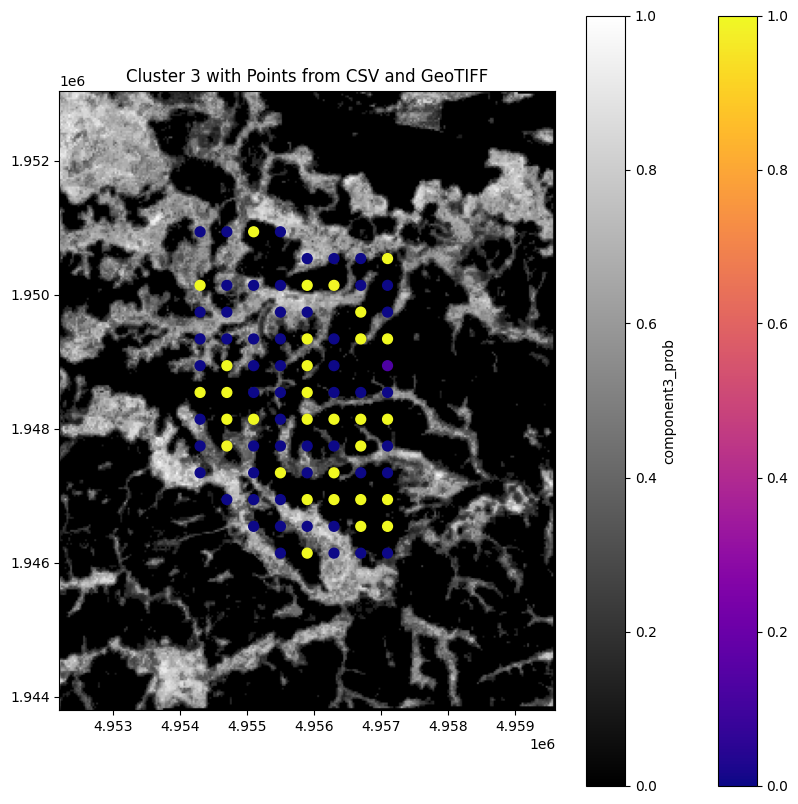

In [ ]:
# Define the path to your CSV file and GeoTIFF file
csv_path = '/content/drive/MyDrive/Doctorado/2023/Septiembre/mergeresults/0817.csv'
tiff_path = '/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif'
plottiff(csv_path,tiff_path)

In [ ]:
from osgeo import gdal, ogr
import numpy as np
import matplotlib.pyplot as plt

def load_and_clip_tif(tif_file, shp_file, save_path=None):
    # Read the TIFF file
    dataset = gdal.Open(tif_file)
    if dataset is None:
        raise Exception("Error: Could not open the TIFF file")

    band = dataset.GetRasterBand(1)
    array = band.ReadAsArray()
    geo_transform = dataset.GetGeoTransform()

    # Read the shapefile
    dataset_shp = ogr.Open(shp_file)
    if dataset_shp is None:
        raise Exception("Error: Could not open the shapefile")

    layer = dataset_shp.GetLayer(0)
    points = []
    for feature in layer:
        geometry = feature.GetGeometryRef()
        x, y = geometry.GetX(), geometry.GetY()
        points.append((x, y))

    # Find the bounding box
    min_x = min(point[0] for point in points)
    max_x = max(point[0] for point in points)
    min_y = min(point[1] for point in points)
    max_y = max(point[1] for point in points)

    # Convert bounding box coordinates to array indices
    x_offset = int((min_x - geo_transform[0]) / geo_transform[1])
    y_offset = int((max_y - geo_transform[3]) / geo_transform[5])
    x_size = int((max_x - min_x) / geo_transform[1])
    y_size = int((min_y - max_y) / geo_transform[5])

    # Clip the array to the bounding box
    clipped_array = array[y_offset:y_offset + y_size, x_offset:x_offset + x_size]

    # Plot the original and clipped TIFF arrays for comparison
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(array, cmap='gray')
    plt.title('Original TIFF')
    plt.subplot(1, 2, 2)
    plt.imshow(clipped_array, cmap='rainbow')
    plt.title('Clipped TIFF')
    plt.show()

    if save_path is not None:
        driver = gdal.GetDriverByName('GTiff')
        clipped_dataset = driver.Create(save_path, clipped_array.shape[1], clipped_array.shape[0], 1, gdal.GDT_Float32)
        clipped_dataset.SetGeoTransform(geo_transform)
        clipped_dataset.SetProjection(dataset.GetProjection())
        clipped_band = clipped_dataset.GetRasterBand(1)
        clipped_band.WriteArray(clipped_array)
        clipped_band.FlushCache()
        clipped_dataset = None  # Close the dataset to save the changes

    return array, clipped_array

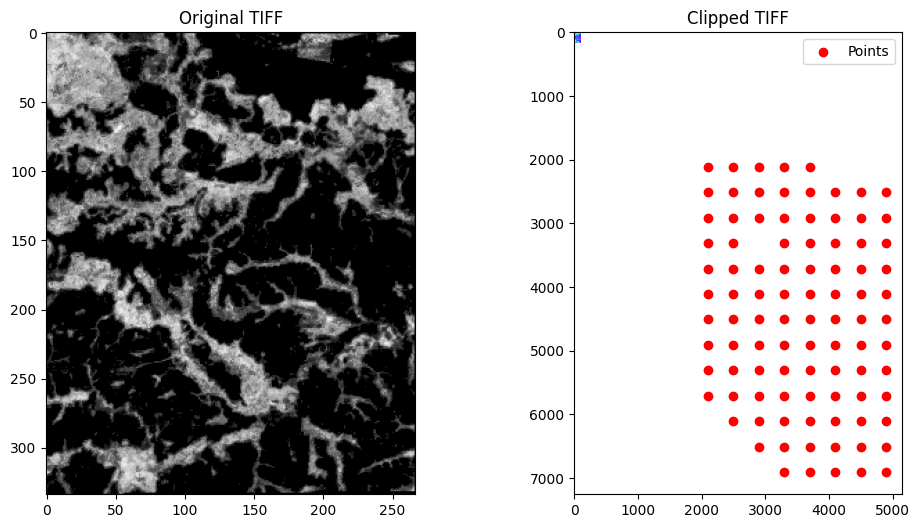

In [ ]:
# Usage example:
tif_file = "/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif"
shp_file = "/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/points/Puntosgrabadoras.shp"
save_path = "/content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/AD.tif"  # Provide the desired save path here
original_array, clipped_array = load_and_clip_tif_with_points(tif_file, shp_file, save_path)


## Make shure that tif files are iin the same points

In [ ]:
from osgeo import gdal, ogr
import numpy as np
import matplotlib.pyplot as plt

def load_and_clip_tif(tif_file, shp_file, save_path=None):
    # Read the TIFF file
    dataset = gdal.Open(tif_file)
    if dataset is None:
        raise Exception("Error: Could not open the TIFF file")

    band = dataset.GetRasterBand(1)
    array = band.ReadAsArray()
    geo_transform = dataset.GetGeoTransform()

    # Read the shapefile
    dataset_shp = ogr.Open(shp_file)
    if dataset_shp is None:
        raise Exception("Error: Could not open the shapefile")

    layer = dataset_shp.GetLayer(0)
    points = []
    for feature in layer:
        geometry = feature.GetGeometryRef()
        x, y = geometry.GetX(), geometry.GetY()
        points.append((x, y))

    # Find the bounding box
    min_x = min(point[0] for point in points)
    max_x = max(point[0] for point in points)
    min_y = min(point[1] for point in points)
    max_y = max(point[1] for point in points)

    # Convert bounding box coordinates to array indices
    x_offset = int((min_x - geo_transform[0]) / geo_transform[1])
    y_offset = int((max_y - geo_transform[3]) / geo_transform[5])
    x_size = int((max_x - min_x) / geo_transform[1])
    y_size = int((min_y - max_y) / geo_transform[5])

    # Clip the array to the bounding box
    clipped_array = array[y_offset:y_offset + y_size, x_offset:x_offset + x_size]

    # Plot the original and clipped TIFF arrays for comparison
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(array, cmap='gray')
    plt.title('Original TIFF')
    plt.subplot(1, 2, 2)
    plt.imshow(clipped_array, cmap='rainbow')
    plt.title('Clipped TIFF')
    plt.show()

    if save_path is not None:
        driver = gdal.GetDriverByName('GTiff')
        clipped_dataset = driver.Create(save_path, clipped_array.shape[1], clipped_array.shape[0], 1, gdal.GDT_Float32)
        clipped_dataset.SetGeoTransform(geo_transform)
        clipped_dataset.SetProjection(dataset.GetProjection())
        clipped_band = clipped_dataset.GetRasterBand(1)
        clipped_band.WriteArray(clipped_array)
        clipped_band.FlushCache()
        clipped_dataset = None  # Close the dataset to save the changes

    return array, clipped_array

In [ ]:
ls /content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/

AD.tif      COB.tif  DN.tif  ICHN.tif  SLAVI.tif
Brillo.tif  DI.tif   FM.tif  NDMI.tif  SL.tif


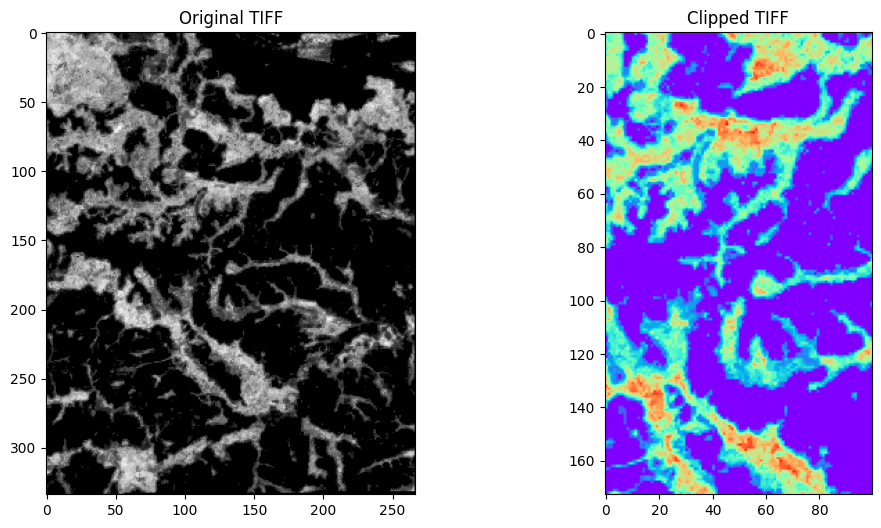

In [ ]:
# Usage example:
tif_file = "/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/AD.tif"
shp_file = "/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/points/Puntosgrabadoras.shp"
save_path = "/content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/AD.tif"  # Provide the desired save path here
original_array, clipped_array = load_and_clip_tif(tif_file, shp_file, save_path)


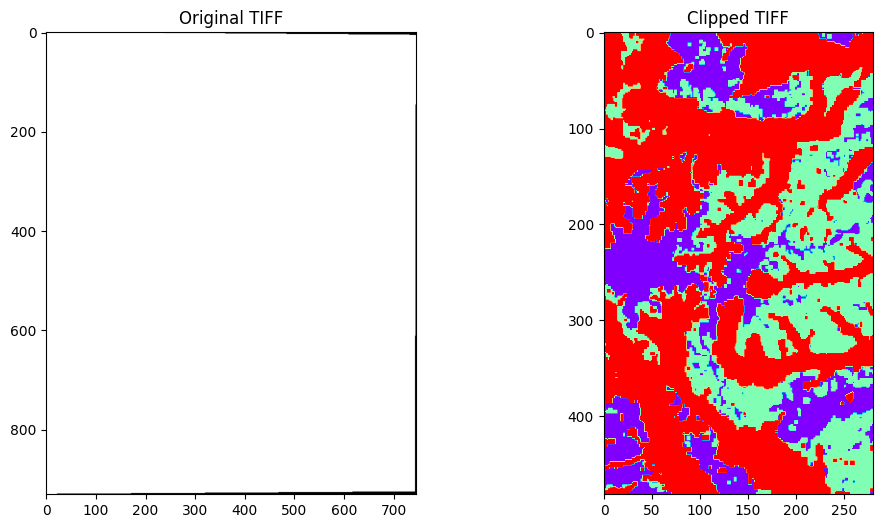

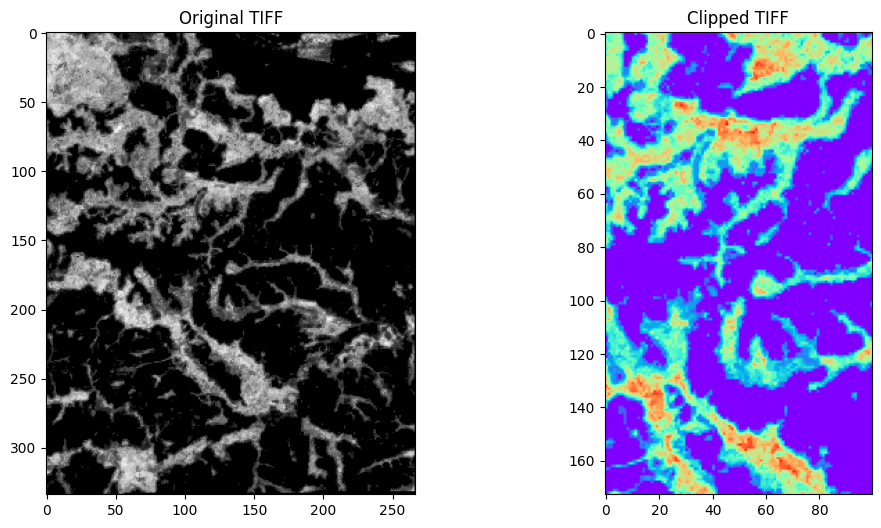

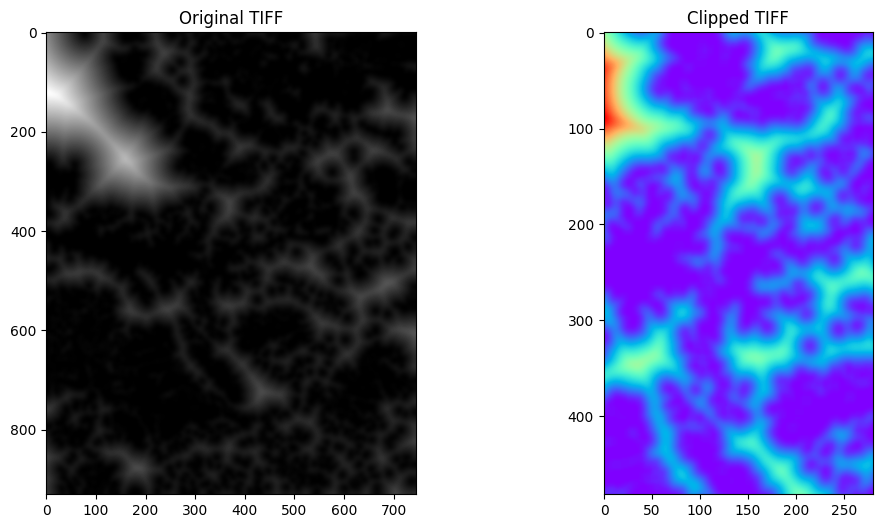

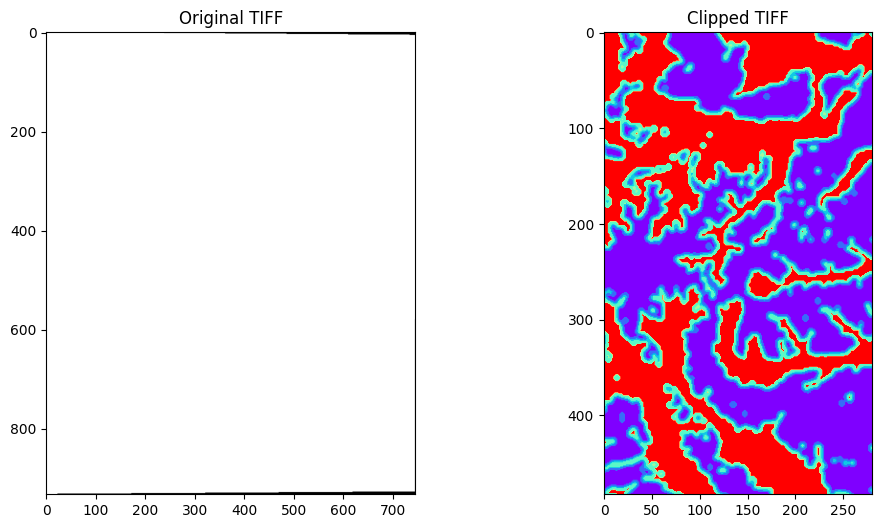

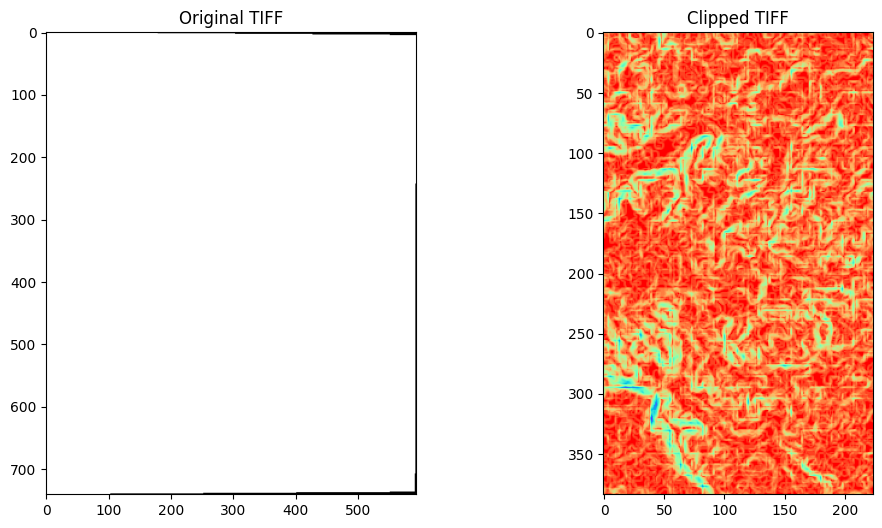

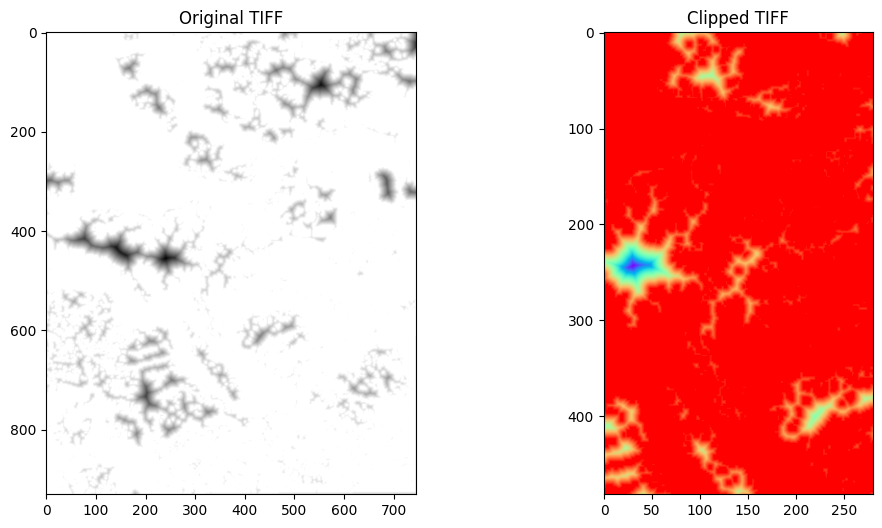

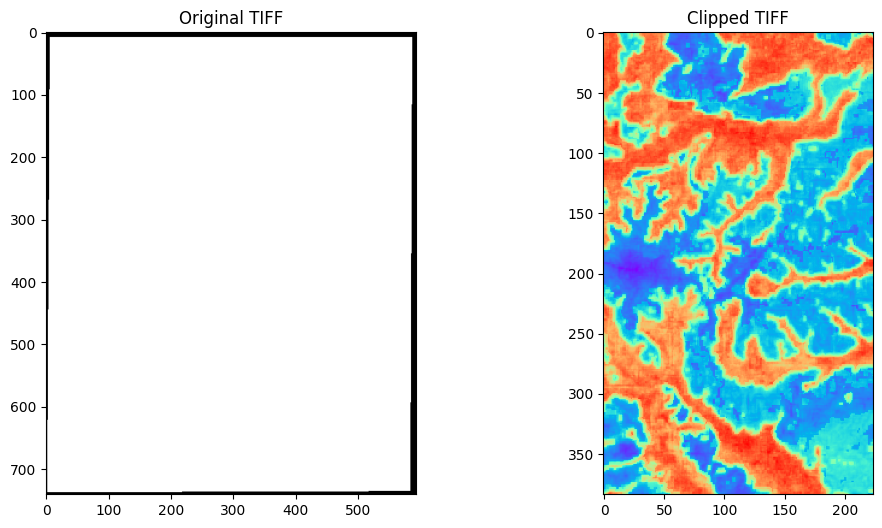

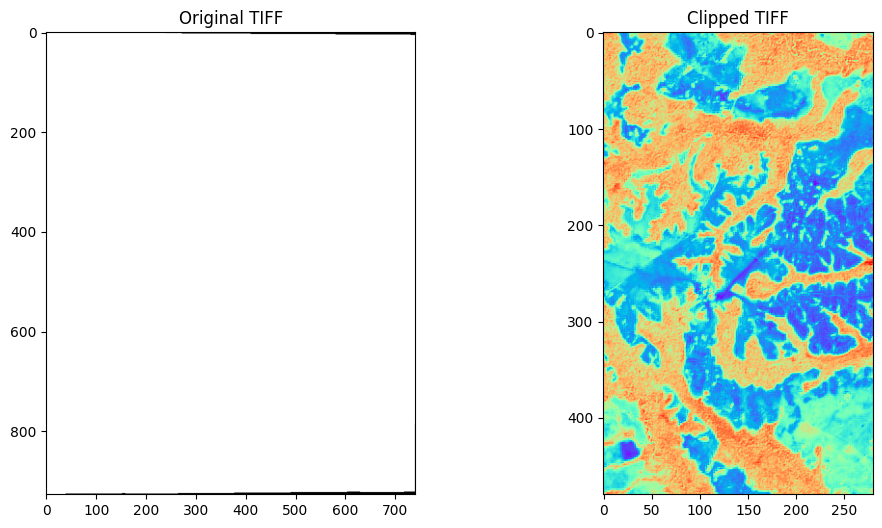

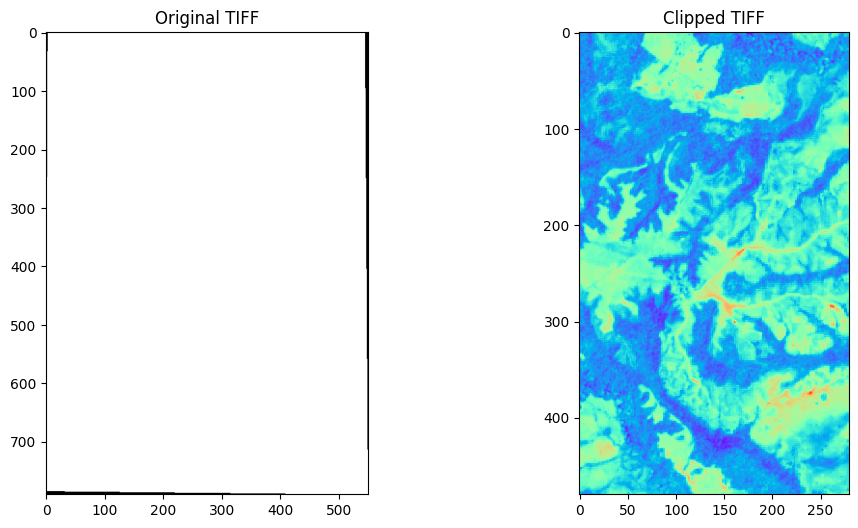

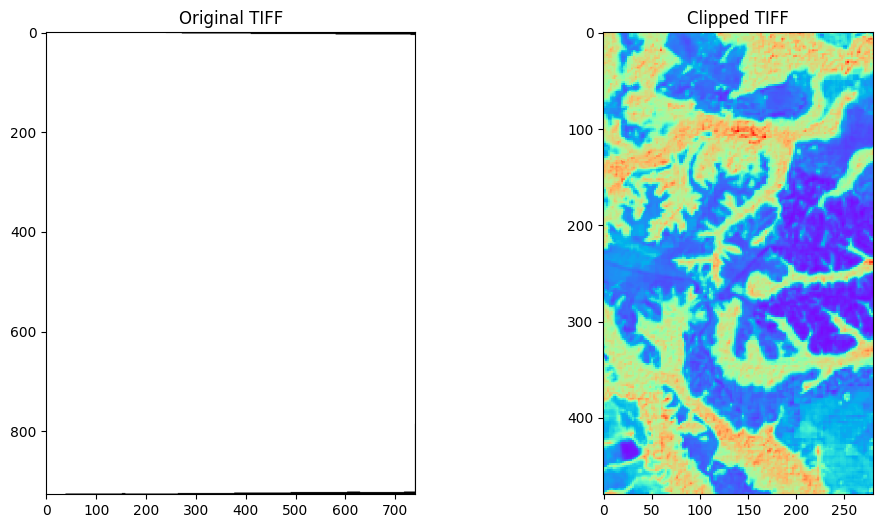

<ipython-input-1-dd2990667692>:48: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  plt.imshow(clipped_array, cmap='rainbow')
<ipython-input-1-dd2990667692>:48: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.imshow(clipped_array, cmap='rainbow')


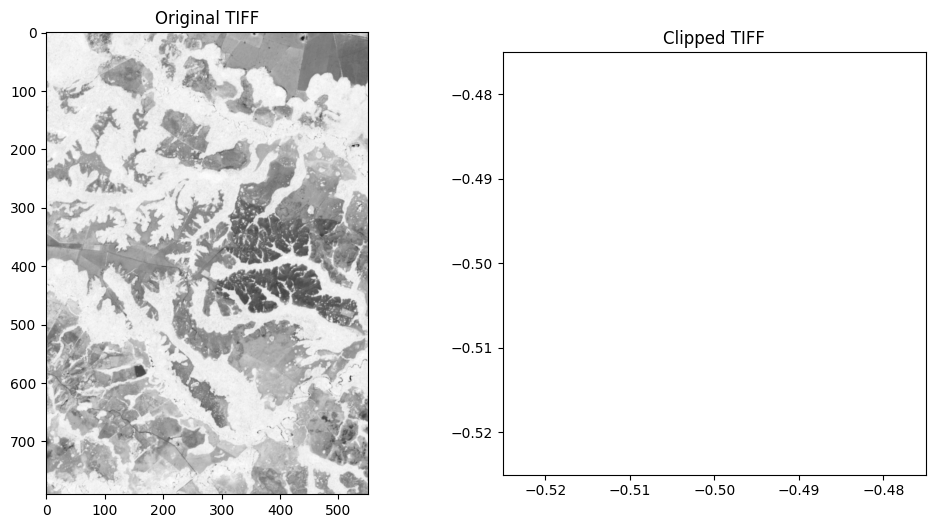

AttributeError: ignored

In [ ]:
import os

source_dir = "/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/"
destination_dir = "/content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/"
shp_file = "/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/points/Puntosgrabadoras.shp"

# Make sure the destination directory exists
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Iterate through the files in the source directory
for filename in os.listdir(source_dir):
    if filename.endswith(".tif"):
        # Create the source and destination file paths
        source_file = os.path.join(source_dir, filename)
        destination_file = os.path.join(destination_dir, filename)

        # Process and save the clipped TIFF
        load_and_clip_tif(source_file, shp_file, save_path=destination_file)

print("Processing completed.")


### correlatiion between two folders


In [ ]:
import os
from osgeo import gdal
import numpy as np

def read_tif(tif_file):
    dataset = gdal.Open(tif_file)
    if dataset is None:
        raise Exception(f"Error: Could not open the TIFF file '{tif_file}'")
    band = dataset.GetRasterBand(1)
    array = band.ReadAsArray()
    return array

def calculate_correlation(tif_file1, tif_file2):
    array1 = read_tif(tif_file1)
    array2 = read_tif(tif_file2)

    # Make sure the two arrays have the same shape
    if array1.shape != array2.shape:
        raise Exception("Error: The two TIFF files have different shapes.")

    # Calculate the correlation coefficient
    correlation = np.corrcoef(array1.flatten(), array2.flatten())[0, 1]
    return correlation

# Usage example:


In [ ]:
from scipy.ndimage import zoom

def read_tif(tif_file):
    dataset = gdal.Open(tif_file)
    if dataset is None:
        raise Exception(f"Error: Could not open the TIFF file '{tif_file}'")
    band = dataset.GetRasterBand(1)
    array = band.ReadAsArray()

    # Replace NaN values with the mean of non-NaN elements
    non_nan_values = array[~np.isnan(array)]
    mean_value = np.nanmean(non_nan_values)
    array[np.isnan(array)] = mean_value

    # Min-max scaling to transform values to the range [0, 1]
    min_val = np.nanmin(array)
    max_val = np.nanmax(array)

    if max_val - min_val == 0:
        # If the difference is zero, set all values to 0.5
        array = np.full(array.shape, 0.5)
    else:
        array = (array - min_val) / (max_val - min_val)

    return array

def resample_array(src_array, src_shape, dst_shape):
    return zoom(src_array, (dst_shape[0] / src_shape[0], dst_shape[1] / src_shape[1]), order=1)



import os
import pandas as pd
import numpy as np
from scipy.spatial import distance

import math
def mean2(x):
    y = np.sum(x) / np.size(x);
    return y

def corr2(a,b):
    a = a - mean2(a)
    b = b - mean2(b)

    r = (a*b).sum() / math.sqrt((a*a).sum() * (b*b).sum());
    return r


def calculate_correlation2(tif_file1, tif_file2):
    array1 = read_tif(tif_file1)
    array2 = read_tif(tif_file2)

    # Resample the arrays to the same shape
    max_height = max(array1.shape[0], array2.shape[0])
    max_width = max(array1.shape[1], array2.shape[1])
    array1_resampled = resample_array(array1, array1.shape, (max_height, max_width))
    array2_resampled = resample_array(array2, array2.shape, (max_height, max_width))

    # Calculate the correlation coefficient
    correlation = corr2(array1_resampled, array2_resampled)
    return correlation

def calculate_correlation(tif_file1, tif_file2):
    array1 = read_tif(tif_file1)
    array2 = read_tif(tif_file2)
    print("array2", array2.shape)
    print("array1", array1.shape)

    # Resample the arrays to the same shape
    max_height = max(array1.shape[0], array2.shape[0])
    max_width = max(array1.shape[1], array2.shape[1])
    array1_resampled = resample_array(array1, array1.shape, (max_height, max_width))
    array2_resampled = resample_array(array2, array2.shape, (max_height, max_width))


    # Calculate the correlation coefficient
    correlation = np.corrcoef(array1_resampled.flatten(), array2_resampled.flatten())[0, 1]
    return correlation


In [ ]:
tif_file1 = "/content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/AD.tif"
tif_file2 = "/content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/AD.tif"
correlation = calculate_correlation(tif_file1, tif_file2)
print(f"Correlation between {tif_file1} and {tif_file2}: {correlation}")


In [ ]:
tif_file1 = "/content/drive/MyDrive/Doctorado/2023/Agosto/Interpolationlayers/5_8_component1_prob_interpolation.tif"
tif_file2 = "/content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/COB.tif"
correlation = calculate_correlation2(tif_file1, tif_file2)
correlation

-0.14548367295562112

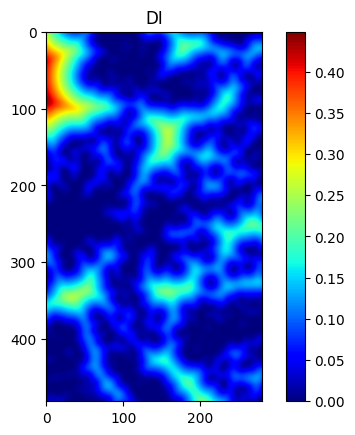

NameError: ignored

In [ ]:
import matplotlib.pyplot as plt
from osgeo import gdal

tif_path = '/content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/DI.tif'
dataset = gdal.Open(tif_path)
band = dataset.GetRasterBand(1)
dataAD = band.ReadAsArray()
plt.imshow(dataAD, cmap='jet')  # cmap='jet' es un ejemplo de mapa de colores, puedes ajustarlo según tus preferencias
plt.colorbar()
plt.title("DI")
plt.show()
AD = ax.imshow(dataAD, origin='lower', extent=[x_min, x_max, y_min, y_max], cmap='jet', alpha=0.5)

In [ ]:
tif_file1 = "/content/drive/MyDrive/Doctorado/2023/Agosto/Interpolationlayers/5_8_component1_prob_interpolation.tif"
tif_file2 = "/content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/COB.tif"
correlation = calculate_correlation(tif_file1, tif_file2)
print(f"Correlation between {tif_file1} and {tif_file2}: {correlation}")


In [ ]:
import os
from osgeo import gdal
import numpy as np

def check_tif_data(tif_file):
    dataset = gdal.Open(tif_file)
    if dataset is None:
        raise Exception(f"Error: Could not open the TIFF file '{tif_file}'")
    band = dataset.GetRasterBand(1)
    array = band.ReadAsArray()

    # Check for non-numeric values
    non_numeric_values = np.isnan(array) | np.isinf(array) | np.isneginf(array)
    if np.any(non_numeric_values):
        return False, "Contains non-numeric (NaN or Inf) values"

    # Check if the array is constant (zero variance)
    if np.nanstd(array) == 0.0:
        return False, "Array is constant (zero variance)"

    return True, "Data is valid"

# Usage example:
tif_file = "/content/drive/MyDrive/Doctorado/2023/Agosto/Interpolationlayers/5_8_component1_prob_interpolation.tif"
is_valid, message = check_tif_data(tif_file)
if is_valid:
    print("TIFF data is valid.")
else:
    print("TIFF data is not valid:", message)

TIFF data is not valid: Contains non-numeric (NaN or Inf) values


In [ ]:
def compare_tif_folders(folder1, folder2):
    tif_files1 = [f for f in os.listdir(folder1) if f.lower().endswith('.tif')]
    tif_files2 = [f for f in os.listdir(folder2) if f.lower().endswith('.tif')]

    correlations = []

    for tif_file1 in tif_files1:
        for tif_file2 in tif_files2:
            tif_path1 = os.path.join(folder1, tif_file1)
            tif_path2 = os.path.join(folder2, tif_file2)
            correlation = calculate_correlation(tif_path1, tif_path2)
            correlations.append((os.path.basename(tif_path1), os.path.basename(tif_path2), correlation))

    return correlations

In [ ]:

tif_folder1 = "/content/drive/MyDrive/Doctorado/2023/Agosto/Interpolationlayers/"
tif_folder2 = "/content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/"
shp_file = "/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/points/Puntosgrabadoras.shp"

correlations = compare_tif_folders(tif_folder1, tif_folder2)


array2 (173, 100)
array1 (334, 334)
array2_resampled (334, 334)
array1_resampled (334, 334)
array2_resampled (334, 334)
array1_resampled (334, 334)
array2_resampled nan [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
array1_resampled nan [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
array2 (482, 281)
array1 (334, 334)
array2_resampled (482, 334)
array1_resampled (482, 334)
array2_resampled (482, 334)
array1_resampled (482, 334)
array2_resampled nan [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... Fal

In [ ]:
correlations

[('20_5_component1_prob_interpolation.tif', 'COB.tif', 0.0036241470081394347),
 ('20_5_component1_prob_interpolation.tif', 'DI.tif', -0.03975553128625207),
 ('20_5_component1_prob_interpolation.tif', 'FM.tif', 0.00972204538865063),
 ('20_5_component1_prob_interpolation.tif', 'SL.tif', 0.007074910721895996),
 ('20_5_component1_prob_interpolation.tif', 'DN.tif', 0.03887026112876652),
 ('20_5_component1_prob_interpolation.tif', 'ICHN.tif', 0.0063723660883199616),
 ('20_5_component1_prob_interpolation.tif', 'NDMI.tif', 0.01753095522229227),
 ('20_5_component1_prob_interpolation.tif',
  'Brillo.tif',
  -0.0003080153746180754),
 ('20_5_component1_prob_interpolation.tif', 'SLAVI.tif', 0.018974041302141753),
 ('20_5_component1_prob_interpolation.tif', 'AD.tif', -0.030901724182548773),
 ('20_5_component2_prob_interpolation.tif', 'COB.tif', -0.11198283909756396),
 ('20_5_component2_prob_interpolation.tif', 'DI.tif', -0.26287578182981647),
 ('20_5_component2_prob_interpolation.tif', 'FM.tif', -0.

In [ ]:
import pandas as pd
df = pd.DataFrame(correlations, columns=["TIF File 1", "TIF File 2", "Correlation"])

# Pivot the DataFrame to get the file names as both row indices and column headers
pivot_df = df.pivot(index="TIF File 1", columns="TIF File 2", values="Correlation")


In [ ]:
pivot_df


TIF File 2,AD.tif,Brillo.tif,COB.tif,DI.tif,DN.tif,FM.tif,ICHN.tif,NDMI.tif,SL.tif,SLAVI.tif
TIF File 1,,,,,,,,,,
17_20_component1_prob_interpolation.tif,0.061777,-0.105635,0.049286,-0.020735,0.051288,0.070334,0.078916,0.125295,-0.037827,0.111147
17_20_component2_prob_interpolation.tif,-0.024050,0.073438,-0.068410,-0.235962,0.004204,-0.042306,-0.053378,-0.034690,0.030544,-0.026909
17_20_component3_prob_interpolation.tif,0.045049,-0.107229,0.101711,0.216572,0.085576,0.068344,0.085851,0.049015,-0.013722,0.052988
17_20_component4_prob_interpolation.tif,-0.113088,0.132060,-0.071533,-0.077309,-0.117802,-0.109920,-0.129243,-0.161392,0.002788,-0.166938
20_5_component1_prob_interpolation.tif,-0.030902,-0.000308,0.003624,-0.039756,0.038870,0.009722,0.006372,0.017531,0.007075,0.018974
20_5_component2_prob_interpolation.tif,-0.110335,0.140843,-0.111983,-0.262876,-0.111563,-0.123152,-0.141742,-0.117543,0.001769,-0.132984
20_5_component3_prob_interpolation.tif,-0.009598,-0.078075,0.037767,0.102158,0.071515,-0.003552,-0.002837,-0.039311,-0.082261,-0.033577
20_5_component4_prob_interpolation.tif,0.113997,-0.037518,0.050404,0.007001,0.028228,0.083706,0.088280,0.064695,0.029027,0.071270
20_5_component5_prob_interpolation.tif,0.113997,-0.037518,0.050404,0.007001,0.028228,0.083706,0.088280,0.064695,0.029027,0.071270


In [ ]:
def compare_tif_folders2(folder1, folder2):
    tif_files1 = [f for f in os.listdir(folder1) if f.lower().endswith('.tif')]
    tif_files2 = [f for f in os.listdir(folder2) if f.lower().endswith('.tif')]

    correlations = []

    for tif_file1 in tif_files1:
        for tif_file2 in tif_files2:
            tif_path1 = os.path.join(folder1, tif_file1)
            tif_path2 = os.path.join(folder2, tif_file2)
            correlation = calculate_correlation2(tif_path1, tif_path2)
            correlations.append((os.path.basename(tif_path1), os.path.basename(tif_path2), correlation))

    return correlations

In [ ]:

tif_folder1 = "/content/drive/MyDrive/Doctorado/2023/Agosto/Interpolationlayers/"
tif_folder2 = "/content/drive/MyDrive/Doctorado/2023/Agosto/capaszamurocliped/"
shp_file = "/content/drive/MyDrive/Doctorado/2023/Julio/capaszamuro/points/Puntosgrabadoras.shp"

correlations = compare_tif_folders2(tif_folder1, tif_folder2)


In [ ]:
correlations

[('20_5_component1_prob_interpolation.tif', 'COB.tif', 0.0036241469824490045),
 ('20_5_component1_prob_interpolation.tif', 'DI.tif', -0.03975553152864685),
 ('20_5_component1_prob_interpolation.tif', 'FM.tif', 0.009722045028302888),
 ('20_5_component1_prob_interpolation.tif', 'SL.tif', 0.007074910900069402),
 ('20_5_component1_prob_interpolation.tif', 'DN.tif', 0.03887025832150271),
 ('20_5_component1_prob_interpolation.tif', 'ICHN.tif', 0.006372365967064503),
 ('20_5_component1_prob_interpolation.tif', 'NDMI.tif', 0.017530955664310843),
 ('20_5_component1_prob_interpolation.tif',
  'Brillo.tif',
  -0.00030801535531080007),
 ('20_5_component1_prob_interpolation.tif', 'SLAVI.tif', 0.0189740399500752),
 ('20_5_component1_prob_interpolation.tif', 'AD.tif', -0.030901721839065147),
 ('20_5_component2_prob_interpolation.tif', 'COB.tif', -0.11198283989835274),
 ('20_5_component2_prob_interpolation.tif', 'DI.tif', -0.26287578369813297),
 ('20_5_component2_prob_interpolation.tif', 'FM.tif', -0.

In [ ]:
import pandas as pd
df = pd.DataFrame(correlations, columns=["TIF File 1", "TIF File 2", "Correlation"])

# Pivot the DataFrame to get the file names as both row indices and column headers
pivot_df = df.pivot(index="TIF File 1", columns="TIF File 2", values="Correlation")


In [ ]:
pivot_df


TIF File 2,AD.tif,Brillo.tif,COB.tif,DI.tif,DN.tif,FM.tif,ICHN.tif,NDMI.tif,SL.tif,SLAVI.tif
TIF File 1,,,,,,,,,,
17_20_component1_prob_interpolation.tif,0.061777,-0.105635,0.049286,-0.020735,0.051288,0.070334,0.078916,0.125295,-0.037827,0.111146
17_20_component2_prob_interpolation.tif,-0.024050,0.073438,-0.068410,-0.235962,0.004204,-0.042306,-0.053378,-0.034690,0.030544,-0.026909
17_20_component3_prob_interpolation.tif,0.045049,-0.107229,0.101711,0.216572,0.085576,0.068344,0.085851,0.049015,-0.013722,0.052988
17_20_component4_prob_interpolation.tif,-0.113088,0.132060,-0.071533,-0.077309,-0.117802,-0.109920,-0.129243,-0.161392,0.002788,-0.166938
20_5_component1_prob_interpolation.tif,-0.030902,-0.000308,0.003624,-0.039756,0.038870,0.009722,0.006372,0.017531,0.007075,0.018974
20_5_component2_prob_interpolation.tif,-0.110335,0.140843,-0.111983,-0.262876,-0.111563,-0.123152,-0.141742,-0.117543,0.001769,-0.132984
20_5_component3_prob_interpolation.tif,-0.009598,-0.078075,0.037767,0.102158,0.071515,-0.003552,-0.002837,-0.039311,-0.082261,-0.033577
20_5_component4_prob_interpolation.tif,0.113997,-0.037518,0.050404,0.007001,0.028228,0.083706,0.088280,0.064695,0.029027,0.071270
20_5_component5_prob_interpolation.tif,0.113997,-0.037518,0.050404,0.007001,0.028228,0.083706,0.088280,0.064695,0.029027,0.071270


In [ ]:
max_value_pos = pivot_df.values.argmax()

# Convert the position to row and column indices
row_index, col_index = divmod(max_value_pos, len(pivot_df.columns))

# Retrieve the column and index labels
max_column = pivot_df.columns[col_index]
max_index = pivot_df.index[row_index]

print("Maximum Value Position:")
print("Column:", max_column)
print("Index:", max_index)

Maximum Value Position:
Column: DI.tif
Index: 17_20_component3_prob_interpolation.tif


# Cluster correlatiion (prototipes) Bats

In [ ]:
import pandas as pd
dfmurcielagos=pd.read_excel("/content/drive/MyDrive/Doctorado/2023/Agosto/EspeciesMurcielagosVictor/Matriz Presencia_Subset 800 MadrugadayAtardecer.xlsx")
dfespecies=pd.read_excel("/content/drive/MyDrive/Doctorado/2023/Agosto/EspeciesMurcielagosVictor/Resumen_puntos.xlsx")

In [ ]:
dfmurcielagos.rename(columns = {'Unnamed: 0':'site'}, inplace = True)
dfespecies.rename(columns = {'Unnamed: 0':'site'}, inplace = True)


In [ ]:
dfmurcielagos

,site,Eumops_cl15,Lasiurus_cl9,Molossus_cl16,Saccopteryx_cl2,Saccopteryx_cl4,Saccopteryx_cl5
0,RZUA01,0,2,0,2,0,0
1,RZUA03b,0,22,31,0,0,0
2,RZUA04,0,10,1,0,0,0
3,RZUA05,0,1,0,0,0,0
4,RZUA06,0,4,35,0,0,0
...,...,...,...,...,...,...,...
60,RZUH09,0,10,1,0,0,0
61,RZUH10,76,3,6,0,0,0
62,RZUH11,5,5,0,0,0,0
63,RZUH12,8,4,2,0,0,0


In [ ]:
dfmurcielagos.columns

Index(['site', 'Eumops_cl15', 'Lasiurus_cl9', 'Molossus_cl16',
       'Saccopteryx_cl2', 'Saccopteryx_cl4', 'Saccopteryx_cl5'],
      dtype='object')

In [ ]:
dfmurcielagos["nespecies"]=dfmurcielagos.sum(axis=1)
dfespecies["nespecies"]=dfespecies.sum(axis=1)
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler instance
scaler = MinMaxScaler()

# Standardize the 'nespecies' column in dfespecies
dfespecies['nespecies'] = scaler.fit_transform(dfespecies[['nespecies']])

# Standardize the 'nespecies' column in dfmurcielagos
dfmurcielagos['nespecies'] = scaler.fit_transform(dfmurcielagos[['nespecies']])

dfmurcielagos

<ipython-input-113-89149a7472cb>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  dfmurcielagos["nespecies"]=dfmurcielagos.sum(axis=1)
<ipython-input-113-89149a7472cb>:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  dfespecies["nespecies"]=dfespecies.sum(axis=1)


,site,Eumops_cl15,Lasiurus_cl9,Molossus_cl16,Saccopteryx_cl2,Saccopteryx_cl4,Saccopteryx_cl5,nespecies
0,RZUA01,0,2,0,2,0,0,0.022222
1,RZUA03b,0,22,31,0,0,0,0.385185
2,RZUA04,0,10,1,0,0,0,0.074074
3,RZUA05,0,1,0,0,0,0,0.000000
4,RZUA06,0,4,35,0,0,0,0.281481
...,...,...,...,...,...,...,...,...
60,RZUH09,0,10,1,0,0,0,0.074074
61,RZUH10,76,3,6,0,0,0,0.622222
62,RZUH11,5,5,0,0,0,0,0.066667
63,RZUH12,8,4,2,0,0,0,0.096296


In [ ]:
dfespecies

,site,Eumops_cl15,Lasiurus_cl9,Molossus_cl16,Saccopteryx_cl2,Saccopteryx_cl4,Saccopteryx_cl5,nespecies
0,RZUA01,4,794,91,39,16,131,0.507561
1,RZUA02,0,1,0,0,0,0,0.000000
2,RZUA03b,95,996,225,45,67,59,0.702268
3,RZUA04,0,105,9,0,10,4,0.060019
4,RZUA05,3,270,23,25,6,56,0.180529
...,...,...,...,...,...,...,...,...
87,RZUH09,10,297,11,20,32,2,0.175331
88,RZUH10,496,362,177,46,24,32,0.536862
89,RZUH11,107,412,30,15,11,5,0.273629
90,RZUH12,8,20,2,0,0,0,0.013705


In [ ]:
import pandas as pd
combined_df=pd.read_csv("/content/drive/MyDrive/Doctorado/2023/Agosto/Resultados_clusteringMembership/combineedallthe_MD.csv")
combined_df

,site,20_5_component1_prob,20_5_component2_prob,20_5_component3_prob,20_5_component4_prob,20_5_component5_prob,17_20_component1_prob,17_20_component2_prob,17_20_component3_prob,17_20_component4_prob,8_17_component1_prob,8_17_component2_prob,8_17_component3_prob,5_8_component1_prob,5_8_component2_prob,5_8_component3_prob
0,RZUA01,5.480498e-146,1.0,0.0,0.0,0.0,7.465868e-11,1.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,1.000000e+00,1.0,0.0,0.000000e+00
1,RZUA03b,3.658164e-228,1.0,0.0,0.0,0.0,6.495266e-181,1.000000e+00,0.0,2.053149e-136,1.000000e+00,0.0,9.668182e-18,1.0,0.0,0.000000e+00
2,RZUA04,0.000000e+00,1.0,0.0,0.0,0.0,0.000000e+00,3.442954e-28,0.0,1.000000e+00,6.678233e-09,0.0,1.000000e+00,1.0,0.0,0.000000e+00
3,RZUA05,2.853957e-53,1.0,0.0,0.0,0.0,2.116084e-27,1.000000e+00,0.0,0.000000e+00,1.611224e-73,0.0,1.000000e+00,1.0,0.0,0.000000e+00
4,RZUA06,2.047282e-237,1.0,0.0,0.0,0.0,6.971128e-52,1.000000e+00,0.0,3.378401e-297,7.284527e-133,0.0,1.000000e+00,1.0,0.0,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,RZUC02,NaN,NaN,NaN,NaN,NaN,0.000000e+00,1.530445e-44,0.0,1.000000e+00,2.898981e-05,0.0,9.999710e-01,NaN,NaN,NaN
92,RZUD02,NaN,NaN,NaN,NaN,NaN,0.000000e+00,2.884759e-77,0.0,1.000000e+00,9.999179e-01,0.0,8.214720e-05,1.0,0.0,0.000000e+00
93,RZUE01,NaN,NaN,NaN,NaN,NaN,9.084967e-32,7.703041e-97,1.0,0.000000e+00,0.000000e+00,1.0,1.175775e-28,0.0,1.0,1.301129e-84
94,RZUF04,NaN,NaN,NaN,NaN,NaN,0.000000e+00,1.193582e-45,0.0,1.000000e+00,3.871807e-06,0.0,9.999961e-01,NaN,NaN,NaN


In [ ]:
selected_columns = combined_df.filter(regex='^(5_8_|17_20_|site)')
selected_columns

,site,17_20_component1_prob,17_20_component2_prob,17_20_component3_prob,17_20_component4_prob,5_8_component1_prob,5_8_component2_prob,5_8_component3_prob
0,RZUA01,7.465868e-11,1.000000e+00,0.0,0.000000e+00,1.0,0.0,0.000000e+00
1,RZUA03b,6.495266e-181,1.000000e+00,0.0,2.053149e-136,1.0,0.0,0.000000e+00
2,RZUA04,0.000000e+00,3.442954e-28,0.0,1.000000e+00,1.0,0.0,0.000000e+00
3,RZUA05,2.116084e-27,1.000000e+00,0.0,0.000000e+00,1.0,0.0,0.000000e+00
4,RZUA06,6.971128e-52,1.000000e+00,0.0,3.378401e-297,1.0,0.0,0.000000e+00
...,...,...,...,...,...,...,...,...
91,RZUC02,0.000000e+00,1.530445e-44,0.0,1.000000e+00,NaN,NaN,NaN
92,RZUD02,0.000000e+00,2.884759e-77,0.0,1.000000e+00,1.0,0.0,0.000000e+00
93,RZUE01,9.084967e-32,7.703041e-97,1.0,0.000000e+00,0.0,1.0,1.301129e-84
94,RZUF04,0.000000e+00,1.193582e-45,0.0,1.000000e+00,NaN,NaN,NaN


In [ ]:
import pandas as pd
import scipy.stats as stats

# Merge the dataframes on 'sites' column
merged_df = pd.merge(selected_columns, dfespecies, on='site')

# Sort the merged dataframe based on 'sites'
merged_df = merged_df.sort_values(by='site')

# Perform Kruskal-Wallis and Spearman correlation tests
kruskal_results = []
spearman_results = []

# Iterate through columns of dfespecies
for dfespecies_column in dfespecies.columns.drop('site'):
    for selected_column in selected_columns.columns.drop('sites'):
        kruskal_pvalue = stats.kruskal(merged_df[dfespecies_column], merged_df[selected_column]).pvalue
        spearman_corr, spearman_pvalue = stats.spearmanr(merged_df[dfespecies_column], merged_df[selected_column])

        kruskal_results.append((dfespecies_column, selected_column, kruskal_pvalue))
        spearman_results.append((dfespecies_column, selected_column, spearman_corr, spearman_pvalue))

# Create dataframes from the test results
kruskal_df = pd.DataFrame(kruskal_results, columns=['DFEspecies_Column', 'Selected_Column', 'Kruskal_PValue'])
spearman_df = pd.DataFrame(spearman_results, columns=['DFEspecies_Column', 'Selected_Column', 'Spearman_Corr', 'Spearman_PValue'])

# Display the test dataframes
print("Kruskal-Wallis Test Results:")
print(kruskal_df)
print("\nSpearman Correlation Test Results:")
print(spearman_df)




KeyError: ignored

In [ ]:
import pandas as pd

# Merge the dataframes on 'sites' column
merged_df = pd.merge(selected_columns, dfespecies, on='site')

# Sort the merged dataframe based on 'sites'
merged_df = merged_df.sort_values(by='site')

# Calculate correlations for all columns in selected_columns
correlation_results = []

# Iterate through columns of selected_columns (excluding 'sites')
for column in selected_columns.columns.drop('site'):
    correlation = merged_df[column].corr(merged_df['nespecies'])
    correlation_results.append((column, correlation))

# Create a dataframe from the correlation results
correlation_df = pd.DataFrame(correlation_results, columns=['Column', 'Correlation'])


In [ ]:
correlation_df

,Column,Correlation
0,17_20_component1_prob,0.000408
1,17_20_component2_prob,0.351127
2,17_20_component3_prob,0.067616
3,17_20_component4_prob,-0.387671
4,5_8_component1_prob,-0.113017
5,5_8_component2_prob,0.080682
6,5_8_component3_prob,0.074660


In [ ]:
import pandas as pd
import numpy as np

# Merge the dataframes on 'sites' column
merged_df = pd.merge(selected_columns, dfmurcielagos, on='site')

# Sort the merged dataframe based on 'sites'
merged_df = merged_df.sort_values(by='site')

# Calculate correlations for all columns in selected_columns
correlation_results = []

# Iterate through columns of selected_columns (excluding 'sites')
for column in selected_columns.columns.drop('site'):
    correlation = merged_df[column].corr(merged_df['nespecies'])
    correlation_results.append((column, np.abs(correlation)))

# Create a dataframe from the correlation results
correlation_df = pd.DataFrame(correlation_results, columns=['Column', 'Correlation'])

In [ ]:
correlation_df

,Column,Correlation
0,17_20_component1_prob,0.117765
1,17_20_component2_prob,0.060159
2,17_20_component3_prob,0.016117
3,17_20_component4_prob,0.028646
4,5_8_component1_prob,0.096825
5,5_8_component2_prob,0.100313
6,5_8_component3_prob,0.175126


In [ ]:
correlation_df["Correlation"].argmax()

6

In [ ]:
import pandas as pd

# Merge the dataframes on 'sites' column
merged_df = pd.merge(selected_columns, dfespecies, on='site')

# Sort the merged dataframe based on 'sites'
merged_df = merged_df.sort_values(by='site')

# Calculate correlations between all columns
correlation_results = []

# Iterate through columns of dfespecies
for dfespecies_column in dfespecies.columns.drop('site'):
    for selected_column in selected_columns.columns.drop('site'):
        correlation = merged_df[dfespecies_column].corr(merged_df[selected_column])
        correlation_results.append((dfespecies_column, selected_column, np.abs(correlation)))

# Create a dataframe from the correlation results
correlation_df = pd.DataFrame(correlation_results, columns=['DFEspecies_Column', 'Selected_Column', 'Correlation'])

# Display the correlation dataframe
correlation_df


,DFEspecies_Column,Selected_Column,Correlation
0,Eumops_cl15,17_20_component1_prob,0.216210
1,Eumops_cl15,17_20_component2_prob,0.212965
2,Eumops_cl15,17_20_component3_prob,0.094793
3,Eumops_cl15,17_20_component4_prob,0.018888
4,Eumops_cl15,5_8_component1_prob,0.095822
5,Eumops_cl15,5_8_component2_prob,0.035997
6,Eumops_cl15,5_8_component3_prob,0.129759
7,Lasiurus_cl9,17_20_component1_prob,0.044965
8,Lasiurus_cl9,17_20_component2_prob,0.356944
9,Lasiurus_cl9,17_20_component3_prob,0.113957


In [ ]:
correlation_df["Correlation"].argmax()

10

In [ ]:
correlation_df.iloc[8,:]

DFEspecies_Column             Lasiurus_cl9
Selected_Column      17_20_component2_prob
Correlation                       0.356944
Name: 8, dtype: object

In [ ]:
import pandas as pd

# Merge the dataframes on 'sites' column
merged_df = pd.merge(selected_columns, dfmurcielagos, on='site')

# Sort the merged dataframe based on 'sites'
merged_df = merged_df.sort_values(by='site')

# Calculate correlations between all columns
correlation_results = []

# Iterate through columns of dfespecies
for dfmurcielagos_column in dfmurcielagos.columns.drop('site'):
    for selected_column in selected_columns.columns.drop('site'):
        correlation = merged_df[dfmurcielagos_column].corr(merged_df[selected_column])
        correlation_results.append((dfmurcielagos_column, selected_column, np.abs(correlation)))

# Create a dataframe from the correlation results
correlation_df = pd.DataFrame(correlation_results, columns=['dfmurcielagos_Column', 'Selected_Column', 'Correlation'])

# Display the correlation dataframe
correlation_df

,dfmurcielagos_Column,Selected_Column,Correlation
0,Eumops_cl15,17_20_component1_prob,0.138706
1,Eumops_cl15,17_20_component2_prob,0.157294
2,Eumops_cl15,17_20_component3_prob,0.083051
3,Eumops_cl15,17_20_component4_prob,0.006116
4,Eumops_cl15,5_8_component1_prob,0.115637
5,Eumops_cl15,5_8_component2_prob,0.044832
6,Eumops_cl15,5_8_component3_prob,0.099511
7,Lasiurus_cl9,17_20_component1_prob,0.021214
8,Lasiurus_cl9,17_20_component2_prob,0.100856
9,Lasiurus_cl9,17_20_component3_prob,0.140272


In [ ]:
correlation_df["Correlation"].argmax()

40

In [ ]:
correlation_df.iloc[40,:]

dfmurcielagos_Column        Saccopteryx_cl5
Selected_Column         5_8_component2_prob
Correlation                        0.419724
Name: 40, dtype: object

# Cluster correlatiion (prototipes) BIRDS

In [ ]:
import pandas as pd
dfaves=pd.read_excel("/content/drive/MyDrive/Doctorado/2023/Agosto/aves/Aves.xlsx")


In [ ]:
dfaves.rename(columns = {'Unnamed: 0':'site'}, inplace = True)


In [ ]:
dfaves

,site,Ave1_cl18,Ave2_cl3,Ave3_cl5,Cluster1920_cl3: Attila Spadiceus,Cluster1920_cl7: Attila Spadiceus
0,RZUA01,1,3331,16,39,47
1,RZUA02,0,2,0,0,1
2,RZUA03b,1,1658,8,62,32
3,RZUA04,1,1745,11,44,27
4,RZUA05,1,874,5,41,67
...,...,...,...,...,...,...
89,RZUH09,0,1104,4,21,31
90,RZUH10,0,3185,32,212,218
91,RZUH11,3,1518,55,26,60
92,RZUH12,0,115,13,5,10


In [ ]:
dfaves.columns

Index(['Unnamed: 0', 'Ave1_cl18 ', 'Ave2_cl3', 'Ave3_cl5',
       'Cluster1920_cl3: Attila Spadiceus',
       'Cluster1920_cl7: Attila Spadiceus'],
      dtype='object')

In [ ]:
dfaves["nespecies"]=dfaves.sum(axis=1)
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler instance
scaler = MinMaxScaler()

# Standardize the 'nespecies' column in dfespecies
dfaves['nespecies'] = scaler.fit_transform(dfaves[['nespecies']])

dfaves

<ipython-input-99-881139a0792e>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  dfaves["nespecies"]=dfaves.sum(axis=1)


,site,Ave1_cl18,Ave2_cl3,Ave3_cl5,Cluster1920_cl3: Attila Spadiceus,Cluster1920_cl7: Attila Spadiceus,nespecies
0,RZUA01,1,3331,16,39,47,0.247781
1,RZUA02,0,2,0,0,1,0.000144
2,RZUA03b,1,1658,8,62,32,0.127030
3,RZUA04,1,1745,11,44,27,0.131866
4,RZUA05,1,874,5,41,67,0.071238
...,...,...,...,...,...,...,...
89,RZUH09,0,1104,4,21,31,0.083652
90,RZUH10,0,3185,32,212,218,0.263154
91,RZUH11,3,1518,55,26,60,0.119885
92,RZUH12,0,115,13,5,10,0.010249


In [ ]:
import pandas as pd
combined_df=pd.read_csv("/content/drive/MyDrive/Doctorado/2023/Agosto/Resultados_clusteringMembership/combineedallthe_MD.csv")
combined_df

,site,20_5_component1_prob,20_5_component2_prob,20_5_component3_prob,20_5_component4_prob,20_5_component5_prob,17_20_component1_prob,17_20_component2_prob,17_20_component3_prob,17_20_component4_prob,8_17_component1_prob,8_17_component2_prob,8_17_component3_prob,5_8_component1_prob,5_8_component2_prob,5_8_component3_prob
0,RZUA01,5.480498e-146,1.0,0.0,0.0,0.0,7.465868e-11,1.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,1.000000e+00,1.0,0.0,0.000000e+00
1,RZUA03b,3.658164e-228,1.0,0.0,0.0,0.0,6.495266e-181,1.000000e+00,0.0,2.053149e-136,1.000000e+00,0.0,9.668182e-18,1.0,0.0,0.000000e+00
2,RZUA04,0.000000e+00,1.0,0.0,0.0,0.0,0.000000e+00,3.442954e-28,0.0,1.000000e+00,6.678233e-09,0.0,1.000000e+00,1.0,0.0,0.000000e+00
3,RZUA05,2.853957e-53,1.0,0.0,0.0,0.0,2.116084e-27,1.000000e+00,0.0,0.000000e+00,1.611224e-73,0.0,1.000000e+00,1.0,0.0,0.000000e+00
4,RZUA06,2.047282e-237,1.0,0.0,0.0,0.0,6.971128e-52,1.000000e+00,0.0,3.378401e-297,7.284527e-133,0.0,1.000000e+00,1.0,0.0,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,RZUC02,NaN,NaN,NaN,NaN,NaN,0.000000e+00,1.530445e-44,0.0,1.000000e+00,2.898981e-05,0.0,9.999710e-01,NaN,NaN,NaN
92,RZUD02,NaN,NaN,NaN,NaN,NaN,0.000000e+00,2.884759e-77,0.0,1.000000e+00,9.999179e-01,0.0,8.214720e-05,1.0,0.0,0.000000e+00
93,RZUE01,NaN,NaN,NaN,NaN,NaN,9.084967e-32,7.703041e-97,1.0,0.000000e+00,0.000000e+00,1.0,1.175775e-28,0.0,1.0,1.301129e-84
94,RZUF04,NaN,NaN,NaN,NaN,NaN,0.000000e+00,1.193582e-45,0.0,1.000000e+00,3.871807e-06,0.0,9.999961e-01,NaN,NaN,NaN


In [ ]:
selected_columns = combined_df.filter(regex='^(5_8_|17_20_|site)')
selected_columns

,site,17_20_component1_prob,17_20_component2_prob,17_20_component3_prob,17_20_component4_prob,5_8_component1_prob,5_8_component2_prob,5_8_component3_prob
0,RZUA01,7.465868e-11,1.000000e+00,0.0,0.000000e+00,1.0,0.0,0.000000e+00
1,RZUA03b,6.495266e-181,1.000000e+00,0.0,2.053149e-136,1.0,0.0,0.000000e+00
2,RZUA04,0.000000e+00,3.442954e-28,0.0,1.000000e+00,1.0,0.0,0.000000e+00
3,RZUA05,2.116084e-27,1.000000e+00,0.0,0.000000e+00,1.0,0.0,0.000000e+00
4,RZUA06,6.971128e-52,1.000000e+00,0.0,3.378401e-297,1.0,0.0,0.000000e+00
...,...,...,...,...,...,...,...,...
91,RZUC02,0.000000e+00,1.530445e-44,0.0,1.000000e+00,NaN,NaN,NaN
92,RZUD02,0.000000e+00,2.884759e-77,0.0,1.000000e+00,1.0,0.0,0.000000e+00
93,RZUE01,9.084967e-32,7.703041e-97,1.0,0.000000e+00,0.0,1.0,1.301129e-84
94,RZUF04,0.000000e+00,1.193582e-45,0.0,1.000000e+00,NaN,NaN,NaN


In [ ]:
import pandas as pd

# Merge the dataframes on 'sites' column
merged_df = pd.merge(selected_columns, dfaves, on='site')

# Sort the merged dataframe based on 'sites'
merged_df = merged_df.sort_values(by='site')

# Calculate correlations for all columns in selected_columns
correlation_results = []

# Iterate through columns of selected_columns (excluding 'sites')
for column in selected_columns.columns.drop('site'):
    correlation = merged_df[column].corr(merged_df['nespecies'])
    correlation_results.append((column, correlation))

# Create a dataframe from the correlation results
correlation_df = pd.DataFrame(correlation_results, columns=['Column', 'Correlation'])


In [ ]:
correlation_df

,Column,Correlation
0,17_20_component1_prob,-0.026217
1,17_20_component2_prob,0.126152
2,17_20_component3_prob,-0.111087
3,17_20_component4_prob,-0.042537
4,5_8_component1_prob,0.176220
5,5_8_component2_prob,-0.089318
6,5_8_component3_prob,-0.139636


In [ ]:
import pandas as pd

# Merge the dataframes on 'sites' column
merged_df = pd.merge(selected_columns, dfaves, on='site')

# Sort the merged dataframe based on 'sites'
merged_df = merged_df.sort_values(by='site')

# Calculate correlations between all columns
correlation_results = []

# Iterate through columns of dfespecies
for dfaves_column in dfaves.columns.drop('site'):
    for selected_column in selected_columns.columns.drop('site'):
        correlation = merged_df[dfaves_column].corr(merged_df[selected_column])
        correlation_results.append((dfaves_column, selected_column, np.abs(correlation)))

# Create a dataframe from the correlation results
correlation_df = pd.DataFrame(correlation_results, columns=['dfaves_Column', 'Selected_Column', 'Correlation'])

# Display the correlation dataframe
correlation_df


,dfaves_Column,Selected_Column,Correlation
0,Ave1_cl18,17_20_component1_prob,0.172518
1,Ave1_cl18,17_20_component2_prob,0.153934
2,Ave1_cl18,17_20_component3_prob,0.143459
3,Ave1_cl18,17_20_component4_prob,0.066777
4,Ave1_cl18,5_8_component1_prob,0.140309
5,Ave1_cl18,5_8_component2_prob,0.093130
6,Ave1_cl18,5_8_component3_prob,0.097169
7,Ave2_cl3,17_20_component1_prob,0.018231
8,Ave2_cl3,17_20_component2_prob,0.116348
9,Ave2_cl3,17_20_component3_prob,0.100171


In [ ]:
correlation_df["Correlation"].argmax()

25

In [ ]:
correlation_df.iloc[8,:]

dfaves_Column                   Ave2_cl3
Selected_Column    17_20_component2_prob
Correlation                     0.116348
Name: 8, dtype: object